# Import

In [1]:
import imutils
from imutils import contours
import scipy
from scipy.spatial import distance as dist
import cv2 as cv
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
import pandas as pd
from os import path, listdir
import os, random
import time
from statannotations.Annotator import Annotator
import seaborn  as sns
import gc
import sys

# Functions

If you need files which include russian letters in their names, read images with 

cv2.imdecode(np.fromfile('изображение.png', dtype=np.uint8), cv2.IMREAD_UNCHANGED)

Look https://www.cyberforum.ru/python/thread2513567.html

In [2]:
sns.color_palette("Set2", n_colors = 4)[1]

(0.9882352941176471, 0.5529411764705883, 0.3843137254901961)

### Function for histogram plot.
Arguments:

\- l_or_r: str, leaves or roots(or plants), is used for plot title

\- color_deff: dict, int or seaborn color palette, is used for coloring plot. If the type is int, meaning the quantity of groups on histogram, then seaborn Set2 will be used

\- df: pandas DataFrame, data for histogram plot

\- columns: dict or list, enumeration of needed columns in dataset. If it is necessary to merge different columns of df, you can use dict, where keys are test groups and values are columns names of df of test groups subsections. Isf you need the same task you also can use 2D list, but int numbers will be as group numbers. For example: columns = {'Monday': \['M_col1', 'M_col2'\], 'Friday':\['F_col1', 'F_col2','F_col3'\]}

\- is_save: bool, True or False, means the necessity of saving the plot

\- figname: str, ends with the needed format (jpg, png). Means the name of the file, if you want it to be saved. It also may contain the path to the needed folder.

\- top_border: int or float. Means the top border of the data. If the data has unreal outliers you can drop it using this threshold. The default value is 300

\- xlabel: str. The default is 'length, mm'

\- param: str. Means the measured parameter (for ex. length, square, width).The default is 'length'

In [3]:
color_dict = {1:'b',
                  2:'orange',
                 3:'g',
                 4:'r',
                 5:'violet'}

def histodram(l_or_r, color_deff, df, columns,  is_save, figname=0, top_border = 300,
              xlabel = 'length, mm', param = 'length'):
    k=0
    isfirst = True
    H=0
    import seaborn as sns
    plt.figure(figsize = (13,13))
    plt.title(r'{0} {param}, automatic measurement'.format(l_or_r,param =  param), fontsize=20)
    plt.xlabel(xlabel, fontsize = 20)
    plt.ylabel('distribution density', fontsize = 20)
    
    
    ### Write for list not only for dict  ###
    
    tmp_list = []
    
    
    if (type(columns)==dict):
        iteration = columns.keys()
        for i in range(len(list(columns.values()))) :
            tmp_list+=list(columns.values())[i]
            
    if (type(columns)==list):
        iteration = range(len(columns))
        for i in range(len(columns)) :
            tmp_list+=list(columns[i])
    
        
    tmp = df[(df[tmp_list]>0)&(df[tmp_list]<top_border)]
        
    
    for g in iteration:
        
        if type(color_deff)==dict:
            c=color_dict[g]
        elif type(color_deff) == int:
            c = sns.color_palette("Set2", n_colors = color_deff)[k]
        else:
            c=color_deff[k] 
        
        k+=1
        label_text = (r'%s' %(str(g)+' mean = '+str(round(float(pd.Series(tmp[columns[g]].values.reshape(-1)).dropna().mean())))
                     +'$\pm$'+str(round(float(pd.Series(tmp[columns[g]].values.reshape(-1)).dropna().std())))))
        n,b,_ = plt.hist(pd.Series(tmp[columns[g]].values.reshape(-1)).dropna(),  color = c, normed=1,
                         label='photo # '+str(g) +'\n'+ label_text, alpha = 0.6)

        if isfirst:
            H = n.max()/4
            h = H/len(columns)
            isfirst = False
        H=n.max()+n.max()/8
        plt.vlines(pd.Series(tmp[columns[g]].values.reshape(-1)).dropna().mean(),0, H, color = c)

        
        plt.text(pd.Series(tmp[columns[g]].values.reshape(-1)).dropna().mean(), n.max(),
             r'%s' %(str(g)+' mean = '+str(round(float(pd.Series(tmp[columns[g]].values.reshape(-1)).dropna().mean())))
                     +'$\pm$'+str(round(float(pd.Series(tmp[columns[g]].values.reshape(-1)).dropna().std()))))+'\n',
             color = c, fontsize = 18)

        print(g,' mean =',str(round(float(pd.Series(tmp[columns[g]].values.reshape(-1)).dropna().mean()))))
#     plt.xlim(left = -50, right = 200)

    matplotlib.rcParams.update({'font.size': 16}) 
#     plt.xlim(left = -50)
    plt.legend()
    if is_save:
        plt.savefig(figname)
    plt.show()

### Shapiro-Wilk test function
The function is used for checking the normality for the data. Perform the Shapiro-Wilk test for normality.

The Shapiro-Wilk test tests the null hypothesis that the data was drawn from a normal distribution.

The function builds the table with the test results for two type or data: for leaves and for roots. As a result the function returns 1D Pandas table with the results of the test.

Arguments:

\- df: pandas DataFrame. The data for the test

\- columns_l: dict, enumeration of needed columns in dataset with the data for leaves. If it is necessary to merge different columns of df, you can use dict, where keys are test groups and values are columns names of df of test groups subsections. Isf you need the same task you also can use 2D list, but int numbers will be as group numbers. For example: columns = {'Monday': \['M_col1_leaves', 'M_col2_leaves'\], 'Friday':\['F_col1_leaves', 'F_col2_leaves','F_col3_leaves'\]} 

\- columns_r: dict, enumeration of needed columns in dataset with the data for roots. If it is necessary to merge different columns of df, you can use dict, where keys are test groups and values are columns names of df of test groups subsections. Isf you need the same task you also can use 2D list, but int numbers will be as group numbers. For example: columns = {'Monday': \['M_col1_roots', 'M_col2_roots'\], 'Friday':\['F_col1_roots', 'F_col2_roots','F_col3_roots'\]} 

\-is_save: bool, True or False, means the necessity of saving the table

\- figname: str, ends with the needed format (csv). Means the name of the file, if you want it to be saved. It also may contain the path to the needed folder.

In [4]:
def shapiro_test (df, columns_l, columns_r, is_save, file_name='file_name.csv'):
    import scipy.stats as sps
    shapiro_table = pd.DataFrame(index =list(str(x)+'leaves' for x in columns_l.keys())+list(str(x)+'roots' for x in columns_r.keys()),
                                columns = ['test_value'])

    
    for i in (list(columns_l.keys())):
        sh_result = scipy.stats.shapiro(df[columns_l[i]].dropna().values.reshape(-1))[1]
        shapiro_table.loc[str(i)+'leaves']  =sh_result
    for i in (list(columns_r.keys())):
        sh_result = scipy.stats.shapiro(df[columns_r[i]].dropna().values.reshape(-1))[1]
        shapiro_table.loc[str(i)+'roots']  =sh_result
    if is_save:
        shapiro_table.to_csv(file_name)
    return shapiro_table

### P-value function
The function is used for checking the independence of two groups using T-test building the table for two type of the data: for leaves and for roots. As a result the function returns symetric 2D Pandas table with the results of the test containing 2 blocks (leaves and roots). Each cell is the result of the T-test by comparing groups of the column and of the row.

Arguments:

\- df: pandas DataFrame. The data for the test

\- columns_l: dict, enumeration of needed columns in dataset with the data for leaves. If it is necessary to merge different columns of df, you can use dict, where keys are test groups and values are columns names of df of test groups subsections. Isf you need the same task you also can use 2D list, but int numbers will be as group numbers. For example: columns = {'Monday': \['M_col1_leaves', 'M_col2_leaves'\], 'Friday':\['F_col1_leaves', 'F_col2_leaves','F_col3_leaves'\]} 

\- columns_r: dict, enumeration of needed columns in dataset with the data for roots. If it is necessary to merge different columns of df, you can use dict, where keys are test groups and values are columns names of df of test groups subsections. Isf you need the same task you also can use 2D list, but int numbers will be as group numbers. For example: columns = {'Monday': \['M_col1_roots', 'M_col2_roots'\], 'Friday':\['F_col1_roots', 'F_col2_roots','F_col3_roots'\]} 

\-is_save: bool, True or False, means the necessity of saving the table

\- figname: str, ends with the needed format (csv). Means the name of the file, if you want it to be saved. It also may contain the path to the needed folder.

In [64]:
def p_value_function (df, columns_r, columns_l, is_save, file_name='file_name.csv'):
    import scipy.stats as sps
    pvalue_table = pd.DataFrame(index = list(str(x)+'roots' for x in columns_r.keys())+list(str(x)+'leaves' for x in columns_l.keys()),
                                columns=list(str(x)+'roots' for x in columns_r.keys())+list(str(x)+'leaves' for x in columns_l.keys()))
    for i in (list(columns_r.keys())):
        for j in (list(columns_r.keys())):
            pvalue_table[str(i)+'roots'].loc[str(j)+'roots'] = scipy.stats.ttest_ind(pd.Series(df[columns_r[i]].values.reshape(-1)).dropna(),
                                                            pd.Series(df[columns_r[j]].values.reshape(-1)).dropna())[1]
    for i in (list(columns_l.keys())):
        for j in (list(columns_l.keys())):
            pvalue_table[str(i)+'leaves'].loc[str(j)+'leaves'] = scipy.stats.ttest_ind(pd.Series(df[columns_l[i]].values.reshape(-1)).dropna(),
                                                            pd.Series(df[columns_l[j]].values.reshape(-1)).dropna())[1]
    pvalue_table.fillna(value='.', inplace = True)
    if is_save:
        pvalue_table.to_csv(file_name)
    return pvalue_table

### Box-plot function
Arguments:

\- l_or_r: str, leaves or roots(or plants), is used for plot title

\- color_deff: dict, int or seaborn color palette, is used for coloring plot. If the type is int, meaning the quantity of groups on histogram, then seaborn Set2 will be used

\- df: pandas DataFrame, data for histogram plot

\- columns: dict, enumeration of needed columns in dataset. If it is necessary to merge different columns of df, you can use dict, where keys are test groups and values are columns names of df of test groups subsections. Isf you need the same task you also can use 2D list, but int numbers will be as group numbers. For example: columns = {'Monday': \['M_col1', 'M_col2'\], 'Friday':\['F_col1', 'F_col2','F_col3'\]}

\- pv_table: pandas DataFrame. P-value data to print them on the plot.

\- comparison_points: list of str or int. Names of groups for comparison with the control group. The elements of the list must be in columns.keys(), and types also should coincide.

\- control_label: int or str. Name of the control group. This value also should be in columns.keys(). The type is dependent on the columns.keys()s elements type

\- is_save: bool, True or False, means the necessity of saving the plot

\- figname: str, ends with the needed format (jpg, png). Means the name of the file, if you want it to be saved. It also may contain the path to the needed folder.

\- union_DF_length: int. Means the length of tmp DataFrame. This tmp DataFrame is needed to merge different collumns of the same group (If you have several photos as a part of the same group, you will have several columns in resulted df). The default value is 130

\- xlabel: str. The default is 'group number'

\- ylabel: str. The default is 'length, mm'

\- param: str. Means the measured parameter (for ex. length, square, width).The default is 'length'


Информация о пакете Annotator взята из ресурса:

https://levelup.gitconnected.com/statistics-on-seaborn-plots-with-statannotations-2bfce0394c00

In [65]:
def box_plot_function(l_or_r, color_deff, df, columns, pv_table,  control_label,comparison_points=None,
                      is_save = False, figname=0,  union_DF_length = 130, xlabel = 'group number', ylabel = 'length, mm',
                      param = 'length', auto_or_man = 'automatic',  is_drop_outliers = False):
    import seaborn as sns
    comparison_points_index=[]
    
    
    
    if type(columns)==dict:
        tmp = pd.DataFrame(columns=list(columns.keys()),index=np.arange(union_DF_length))
        for i in columns.keys():
            tmp[i] = pd.DataFrame(pd.Series(df[columns[i]].values.reshape(-1)).dropna())
        if comparison_points==None:
            comparison_points = list(columns.keys())
            comparison_points.remove(control_label)
        for i in comparison_points:
            comparison_points_index.append(list(columns.keys()).index(i))
        control_label = list(columns.keys()).index(control_label) 
        group_number_names = list(columns.keys())
    elif type(columns)==list: #### still 1D
        tmp = df
        if comparison_points==None:
            comparison_points = list(columns)
            comparison_points.remove(control_label)
        control_label = list(columns).index(control_label) # для аннотатора нужен именно интовый индекс 
        group_number_names = columns ## если 2D массив, то range где кажд индекс +1 range(1, len(columns)+1)
        for i in comparison_points:
            comparison_points_index.append(columns.index(i)) ## если колонки заданы листом, то имена групп 
        ## не известны, только номера, значит type(comp points[i])=int
    if is_drop_outliers:
        tmp = drop_outliers(tmp, tmp.columns)    
    if type(color_deff)==dict:
        c=color_dict.values()
    if type(color_deff) == int:
        c = sns.color_palette("Set2", n_colors = color_deff)
    else:
        c=color_deff        
    
    fig = plt.figure(figsize = (16,10))
    ax = fig.add_subplot(111)    
    plt.xlabel(xlabel, fontsize = 20)
    plt.ylabel(ylabel, fontsize = 20)
    
    if l_or_r == 'leaves': #in p_val_table there are two groups: first is roots, second is leaves, look the previous def
        shift = len(pv_table)//2
    else:
        shift = 0
    
    sns.boxplot(data=tmp[list(columns.keys())], palette=c)
        
    
    pairs = [(group_number_names[control_label],group_number_names[int(i)]) for i in comparison_points_index]
    formatted_pvalues = [f'p-value={pv_table.iloc[control_label+shift,int(i)+shift]:.2e}' for i in comparison_points_index]
    
    annotator = Annotator(ax, pairs, data=tmp[group_number_names], palette=c)
    annotator.set_custom_annotations(formatted_pvalues )
    annotator.annotate()

    matplotlib.rcParams.update({'font.size': 16}) 
    
    plt.title(r'{0} {param}, {auto_or_man} measurement'.format(l_or_r, param = param, auto_or_man=auto_or_man), fontsize=20)
    if is_save:
        plt.savefig(figname)
    plt.show()
    return tmp

### Bar-plot function
Arguments:

\- l_or_r: str, leaves or roots(or plants), is used for plot title

\- color_deff: dict, int or seaborn color palette, is used for coloring plot. If the type is int, meaning the quantity of groups on histogram, then seaborn Set2 will be used

\- df: pandas DataFrame, data for histogram plot

\- columns: dict or 1d list, enumeration of needed columns in dataset. If it is necessary to merge different columns of df, you can use dict, where keys are test groups and values are columns names of df of test groups subsections. Isf you need the same task you also can use 2D list, but int numbers will be as group numbers. For example: columns = {'Monday': \['M_col1', 'M_col2'\], 'Friday':\['F_col1', 'F_col2','F_col3'\]}. // If you don't need to merge df, you can just use 1d list with group names, for example \['Monday', 'Friday'\]

\- pv_table: pandas DataFrame. P-value data to print them on the plot.

\- control_label: int or str. Name of the control group. This value also should be in columns.keys() (or in 1d list of columns). The type is dependent on the columns.keys()s elements type

\- comparison_points: list of str or int. Names of groups for comparison with the control group. The elements of the list must be in columns.keys() (or in 1d list of columns), and types also should coincide. This parametr is optional, the default is all the groups exept control_label. If you don't need all the groups to be compared, define this parametr. 

\- is_save: bool, True or False, means the necessity of saving the plot.The default is False.

\- figname: str, ends with the needed format (jpg, png). Means the name of the file, if you want it to be saved. It also may contain the path to the needed folder.

\- union_DF_length: int. Means the length of tmp DataFrame. This tmp DataFrame is needed to merge different collumns of the same group (If you have several photos as a part of the same group, you will have several columns in resulted df). The default value is 130

\- xlabel: str. The default is 'group number'

\- ylabel: str. The default is 'length, mm'

\- param: str. Means the measured parameter (for ex. length, square, width).The default is 'length'


In [66]:
def bar_plot_function(l_or_r, color_deff, df, columns, pv_table,  control_label,comparison_points=None,
                      is_save = False, figname=0,  union_DF_length = 130, xlabel = 'group number', ylabel = 'length, mm',
                      param = 'length', auto_or_man = 'automatic',  is_drop_outliers = False):
    import seaborn as sns
    
    comparison_points_index=[]
    
    
    
    if type(columns)==dict:
        tmp = pd.DataFrame(columns=list(columns.keys()),index=np.arange(union_DF_length))
        for i in columns.keys():
            tmp[i] = pd.DataFrame(pd.Series(df[columns[i]].values.reshape(-1)).dropna())
        if comparison_points==None:
            comparison_points = list(columns.keys())
            comparison_points.remove(control_label)
        for i in comparison_points:
            comparison_points_index.append(list(columns.keys()).index(i))
        control_label = list(columns.keys()).index(control_label) 
        group_number_names = list(columns.keys())
    elif type(columns)==list: #### still 1D
        tmp = df
        if comparison_points==None:
            comparison_points = list(columns)
            comparison_points.remove(control_label)
        control_label = list(columns).index(control_label) # для аннотатора нужен именно интовый индекс 
        group_number_names = columns ## если 2D массив, то range где кажд индекс +1 range(1, len(columns)+1)
        for i in comparison_points:
            comparison_points_index.append(columns.index(i)) ## если колонки заданы листом, то имена групп 
        ## не известны, только номера, значит type(comp points[i])=int
    if is_drop_outliers:
        tmp = drop_outliers(tmp, tmp.columns)         
    if type(color_deff)==dict:
        c=color_dict.values()
    if type(color_deff) == int:
        c = sns.color_palette("Set2", n_colors = color_deff)
    else:
        c=color_deff        
    
    fig = plt.figure(figsize = (16,10))
    ax = fig.add_subplot(111)    
    plt.xlabel(xlabel, fontsize = 20)
    plt.ylabel(ylabel, fontsize = 20)
    
    if l_or_r == 'leaves': #in p_val_table there are two groups: first is roots, second is leaves, look the previous def
        shift = len(pv_table)//2
    else:
        shift = 0
          
    sns.barplot(data=tmp[group_number_names], palette=c)
        
    
    pairs = [(group_number_names[control_label],group_number_names[int(i)]) for i in comparison_points_index]
    formatted_pvalues = [f'p-value={pv_table.iloc[control_label+shift,int(i)+shift]:.2e}' for i in comparison_points_index]
    
    annotator = Annotator(ax, pairs, data=tmp[group_number_names], palette=c)
    annotator.set_custom_annotations(formatted_pvalues )
    annotator.annotate()

    matplotlib.rcParams.update({'font.size': 16}) 
    
    plt.title(r'{0} {param}, {auto_or_man} measurement'.format(l_or_r, param = param, auto_or_man=auto_or_man), fontsize=20)
    if is_save:
        plt.savefig(figname)
    plt.show()
    del tmp                                       

### Length calculating

The function calculates the plant part length by its width, square and pixel_per_metric coefficient. If the width is zero, functon returns length value as 0.

In [8]:
def length(width, square, pixel):
    if (width!=0):
        length = square/(width*pixel)
    else:
        length = 0
    return length

### Folders_list_functions

Если папок для перечисления много, то можно вызвать функцию, которая скомпанует всё что лежит в папке в один лист

In [9]:
def folders_list_function(path_to_file_folder):
    folders_list=[]
    for filename_in_folder in listdir(path_to_file_folder):
        folders_list.append(filename_in_folder)

    if '.ipynb_checkpoints' in folders_list:
        folders_list.remove('.ipynb_checkpoints')
    if 'template' in folders_list:
        folders_list.remove('template')
    return folders_list

### files_dicts

The function builds dicts with names of the columns in df, based on photos filenames. The main feachure is that all the columns names are merged by test groups names. Keys are the test groups names. Returns leaves_dict, roots_dict, roots_area_dict, plant_area_dict -- dicts with columns related to a specific test group.

In [10]:
def files_dicts(path_to_file_folder_fixed):
    folders_list = folders_list_function(path_to_file_folder_fixed)

    leaves_dict = dict()
    for i in folders_list:
        leaves_dict[i] = []

    for g in folders_list:
    #     pic_num=0
        path_to_file_folder = path_to_file_folder_fixed
        path_to_file_folder = path.join(path_to_file_folder, str(g)+'/')
        for filename_in_folder in listdir(path_to_file_folder):
    #         pic_num +=1
    #         if pic_num>3:
    #             continue
            if filename_in_folder!='.ipynb_checkpoints':
                file_name = path.join(path_to_file_folder, filename_in_folder)
                leaves_dict[g].append('leaves_length_'+file_name)

    roots_dict = dict()
    for i in folders_list:
        roots_dict[i] = []   

    for g in folders_list:
    #     pic_num=0
        path_to_file_folder = path_to_file_folder_fixed
        path_to_file_folder = path.join(path_to_file_folder, str(g)+'/')
        for filename_in_folder in listdir(path_to_file_folder):
    #         pic_num +=1
    #         if pic_num>3:
    #             continue
            if filename_in_folder!='.ipynb_checkpoints':
                file_name = path.join(path_to_file_folder, filename_in_folder)
                roots_dict[g].append('roots_length_'+file_name)

    roots_area_dict = dict()
    for i in folders_list:
        roots_area_dict[i] = [] 

    for g in folders_list:
        path_to_file_folder = path_to_file_folder_fixed
        path_to_file_folder = path.join(path_to_file_folder, str(g)+'/')
        for filename_in_folder in listdir(path_to_file_folder):
            if filename_in_folder!='.ipynb_checkpoints':
                file_name = path.join(path_to_file_folder, filename_in_folder)
                roots_area_dict[g].append('roots_area_'+file_name)

    plant_area_dict = dict()
    for i in folders_list:
        plant_area_dict[i] = [] 

    for g in folders_list:
        path_to_file_folder = path_to_file_folder_fixed
        path_to_file_folder = path.join(path_to_file_folder, str(g)+'/')
        for filename_in_folder in listdir(path_to_file_folder):
            if filename_in_folder!='.ipynb_checkpoints':
                file_name = path.join(path_to_file_folder, filename_in_folder)
                plant_area_dict[g].append('plant_area_'+file_name)
    return leaves_dict, roots_dict, roots_area_dict, plant_area_dict

### Drop outliers

Function drops values lying lower or upper than 25 or 75 quartille.

In [11]:
def drop_outliers(df, columns):
    for x in list(columns):
#         print(x)
#         print(df[x].values.reshape(-1))
        q75,q25 = np.percentile(pd.Series(df[x].values.reshape(-1)).dropna(),[75,25])
#         print(q75,q25)
        intr_qr = q75-q25

        max = q75+(1.5*intr_qr)
        min = q25-(1.5*intr_qr)
        
        df.loc[df[x] < min,x] = np.nan
        df.loc[df[x] > max,x] = np.nan
    return df

### Drop seeds

Можно попробовать посчитать сколько ненулевых пикселей в маске и это будет быстрее чем попиксельный подсчет. Т к тип маски это массив нулевых-ненулевых пиксилей

In [12]:
def pixel_color_conditions(pixel ,h1=0, h2=255, s1=0, s2=255, v1=0, v2=255):
    h, s, v = pixel # pixel = img_hsv[x, y]
    h_condition = (h>=h1)&(h<=h2)
    s_condition = (s>=s1)&(s<=s2)
    v_condition = (v>=v1)&(v<=v2)
    full_condition = h_condition*s_condition*v_condition
    return full_condition

def drop_seeds_slow(src, contours, h1=0, h2=255, s1=0, s2=255, v1=0, v2=255):
    src_hsv  = cv.cvtColor(src, cv.COLOR_BGR2HSV)
    seeds_square_list = np.zeros(len(contours))
    h_min = np.array((h1, s1, v1), np.uint8)
    h_max = np.array((h2, s2, v2), np.uint8)
    tresh = cv.inRange(src_hsv, h_min, h_max)
    for i in range(len(contours)):
        c = contours[i]
        cimg1 = np.zeros_like(src)
        cv.drawContours(cimg1, contours, i, color=255, thickness=-1)
        pts = np.where(cimg1 == 255)
        for x, y in zip(pts[0], pts[1]):                   
            if pixel_color_conditions(src_hsv[x, y], h1, h2, s1, s2, v1, v2):
                src_hsv[x, y] = [0,0,0]
                seeds_square_list[i]+=1
    src  = cv.cvtColor(src_hsv, cv.COLOR_HSV2BGR)
    plt.figure(figsize=(14,14))
    plt.imshow(tresh)
    plt.show()
    return src, seeds_square_list

def drop_seeds(src, h1=0, h2=255, s1=0, s2=255, v1=0, v2=255):
    src_hsv  = cv.cvtColor(src, cv.COLOR_BGR2HSV)
    h_min = np.array((h1, s1, v1), np.uint8)
    h_max = np.array((h2, s2, v2), np.uint8)
    tresh = cv.inRange(src_hsv, h_min, h_max)
    tresh=cv.bitwise_not(tresh)
    mask = cv.bitwise_or(src, src, mask=tresh)
    return mask

### Color range counter

Функция считает, сколько пикселей на картинке лежит в данном цветовом диапазоне внутри каждого контура. На выходе дает массивразмером совпадающим с 

In [13]:
def color_range_counter(src, contours, h1=0, h2=255, s1=0, s2=255, v1=0, v2=255):
    src_hsv  = cv.cvtColor(src, cv.COLOR_BGR2HSV)
    h_min = np.array((h1, s1, v1), np.uint8)
    h_max = np.array((h2, s2, v2), np.uint8)
    thresh = cv.inRange(src_hsv, h_min, h_max)
    thresh = np.clip(thresh, 0,1)
    counter = np.zeros(len(contours))
    for i in range(len(contours)):
        c = contours[i]
        cimg1 = np.zeros_like(thresh)
        cv.drawContours(cimg1, contours, i, color=255, thickness=-1)
#         plt.figure(figsize=(14,14))
#         plt.imshow(cimg1)
#         plt.show()
#         plt.figure(figsize=(14,14))
#         plt.imshow(thresh)
#         plt.show()

#         print('plant area = ', cv.contourArea(c) )
        cimg1 = np.clip(cimg1, 0 ,1)
        counter[i] = (cimg1*thresh).sum()
#     print(counter)
    return counter

Есть идея вместо попиксельного подсчета и итерирования по координатам сделать маски, соответствующие листьям, корням и семенам и после этого посчитать пересечение этой маски с контуром

In [14]:
np.set_printoptions(threshold = 500)
print(c*t)

NameError: name 'c' is not defined

### Find_paper

In [47]:
def find_paper (src, template_size, square_threshold, position_x_axes, canny_top = 100, canny_bottom = 10, morf = 7, gauss = 3):
    gr = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
    bl=cv.GaussianBlur(src,(gauss,gauss),0)
    canny = cv.Canny(bl, canny_bottom, canny_top)
    kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (int(morph), int(morph)))
    closed = cv.morphologyEx(canny, cv.MORPH_CLOSE, kernel)
    contours0 = cv.findContours(closed.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)[0]
    # contours0 = contours0[0] if imutils.is_cv2() else contours0[1]
    (contours0, _) = contours.sort_contours(contours0)
    

    
    for cont in contours0:
#         cv.drawContours(src,[cont],0,(0,255,0),-2)
        center, radius = cv.minEnclosingCircle(cont)
        if (cv.contourArea(cont)>square_threshold)&(center[0]>position_x_axes): #position = src.shape[1]//8
            sm = cv.arcLength(cont, True)
            apd = cv.approxPolyDP(cont, 0.025*sm, True)
            center, radius = cv.minEnclosingCircle(cont)
            cv.drawContours(src, [cont], -1, (0,255,0), -2)
#             if len(apd) == 4:
            is_paper_founded = True
            paper = cont
#                 print('paper')
            cv.drawContours(src, [cont], -1, (0,255,0), -2)
            pixelsPerMetric = 7.6
            box = cv.minAreaRect(cont)
            box = cv.boxPoints(box)
            box = np.array(box, dtype="int")
            (tl, tr, br, bl) = box
            (tltrX, tltrY) = midpoint(tl, tr)
            (blbrX, blbrY) = midpoint(bl, br)
            (tlblX, tlblY) = midpoint(tl, bl)
            (trbrX, trbrY) = midpoint(tr, br)
            dA = dist.euclidean((tltrX, tltrY), (blbrX, blbrY))
            dB = dist.euclidean((tlblX, tlblY), (trbrX, trbrY))
#             if (dB/template_size > (square_threshold/)):                
            pixelsPerMetric = math.sqrt(cv.contourArea(cont)/(template_size))
            ppm.append(pixelsPerMetric)
#             else:
#                 pixelsPerMetric = ppm[-1]

            
            

            rect = cv.minAreaRect(apd)
            box = cv.boxPoints(rect) # поиск четырех вершин прямоугольника
            box = np.int0(box) # округление координат
            print(pixelsPerMetric)
            cv.drawContours(src,[cont],0,(0,255,0),-2)
            break
    plt.figure(figsize=(14,14))
    plt.imshow(src)
    plt.show()
    return pixelsPerMetric

### Random file

In [16]:
def random_file(path_to_file_folder):
    a=random.choice(os.listdir(path_to_file_folder))
    while (a=='template')|(a=='.ipynb_checkpoints'):
        a=random.choice(os.listdir(path_to_file_folder))
    path_to_file = path.join(path_to_file_folder, a+'/')
    b = random.choice(os.listdir(path_to_file))
    while (b=='.ipynb_checkpoints'):
        b=random.choice(os.listdir(path_to_file))
    path_to_file = path.join(path_to_file, b)
    return path_to_file

### Class of parameters

In [17]:
class picture_params:   
    count = 0  
    def __init__(self):  
        picture_params.count += 1 
    def contour_params(self, morph, gauss, canny_bottom, canny_top): 
        self.morph = morph 
        self.gauss = gauss 
        self.canny_bottom = canny_bottom 
        self.canny_top = canny_top
  
    def color(self, h1,h2,s1,s2,v1,v2):
        self.h1 = h1
        self.h2 = h2
        self.s1 = s1
        self.s2 = s2
        self.v1 = v1
        self.v2 = v2
    
    def display_count(self):  
        print('Groups total number: %d' % picture_params.count)
        
    def return_bl_params(self):  
        return self.morph, self.gauss, self.canny_bottom, self.canny_top 
    def display_element(self):
        attrs = vars(self)
        print(', '.join("%s: %s" % item for item in attrs.items()))
        
    def return_colors(self):
        return self.h1,self.h2,self.s1,self.s2,self.v1,self.v2

# Main.AUTOMATIC

## Parameters

In [85]:
def position_x_axes(src,divider):
    return src.shape[1]//divider

ppm = [7.45]
path_to_file_folder_fixed = 'photos/'
paper_square = 79*79
paper_square_thresold = 5000
x_pos_divider = 10
contour_square_threshold = 1000 # look at your img size and evaluate the threshold, 1000 is recomended
template_filename = path_to_file_folder_fixed+'template/template.jpg'

### Bluring

In [115]:
import cv2 as cv
import numpy as np
# import video

if __name__ == '__main__':
    def nothing(*arg):
        pass


    
cv.namedWindow( "result", cv.WINDOW_NORMAL ) # создаем главное окно
cv.namedWindow( "b" ) # создаем окно настроек

file_name =  random_file(path_to_file_folder_fixed)
# file_name = '7day/7day/IMG_20220804_193701_228-01.jpeg'
src = cv.imread(file_name)

cap=src
# cap = cv.imread('6finish.jpg')
# создаем 6 бегунков для настройки начального и конечного цвета фильтра
cv.createTrackbar('morph', 'b', 0, 7, nothing)
cv.createTrackbar('gauss', 'b', 0, 7, nothing)
cv.createTrackbar('canny_bottom', 'b', 0, 255, nothing)
cv.createTrackbar('canny_top', 'b', 255, 255, nothing)
crange = [0,0,0, 0,0,0]

hsv = cv.cvtColor(src, cv.COLOR_BGR2HSV )

while True:
#     img = cv.imread('6finish.jpg')
    src=cv.imread(file_name)
    # считываем значения бегунков
    
    init = [0,0,0,0]
    morph = cv.getTrackbarPos('morph', 'b')
    gauss = cv.getTrackbarPos('gauss', 'b')
    canny_bottom = cv.getTrackbarPos('canny_bottom', 'b')
    canny_top = cv.getTrackbarPos('canny_top', 'b')
    
    morph = 2* morph+1
    gauss = 2*gauss+1
    
    l = [morph, gauss, canny_bottom, canny_top]
    is_change = True
    is_change = any(init[i]!=l[i] for i in range (4))
    init = l
     
 
    ch = cv.waitKey(5)
    if ch == 27:
        break

    if (is_change):
        gr = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
        #         bl = cv.medianBlur(src, 3)
        bl=cv.GaussianBlur(src,(gauss,gauss),0)

        #         ret, thresh = cv.threshold(bl, 120,255,0)
        kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (int(morph), int(morph)))
        closed = cv.morphologyEx(bl, cv.MORPH_CLOSE, kernel)
        canny = cv.Canny(closed, canny_bottom, canny_top)
        kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (int(morph), int(morph)))
        closed = cv.morphologyEx(canny, cv.MORPH_CLOSE, kernel)
        contours0 = cv.findContours(closed.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)[0]
        # contours0 = contours0[0] if imutils.is_cv() else contours0[1]
        (contours0, _) = contours.sort_contours(contours0)
        pixelsPerMetric = None
        quantity_of_plants = 0
        real_conts = []


        for cont in contours0:
            center, radius = cv.minEnclosingCircle(cont)
            if (cv.contourArea(cont)>3000)&(center[0] >100)&(center[0] < 2000):
        #         print(cv.contourArea(cont))
                quantity_of_plants+=1
                #сглаживание и определение количества углов
                sm = cv.arcLength(cont, True)
                apd = cv.approxPolyDP(cont, 0.02*sm, True)
                cv.drawContours(src, [cont], -1, (255,0,0), -2)
        
    if ch == 49:
        group_param = picture_params()
        picture_params.contour_params(group_param, morph,gauss,canny_bottom,canny_top)
    cv.imshow('result', src)
    
cv.destroyAllWindows()
       


### Roots and leaves

In [97]:
import cv2 as cv
import numpy as np
# import video

if __name__ == '__main__':
    def nothing(*arg):
        pass


    
cv.namedWindow( "result", cv.WINDOW_NORMAL ) # создаем главное окно
cv.namedWindow( "b" ) # создаем окно настроек

file_name = random_file(path_to_file_folder_fixed)
src = cv.imread(file_name)

img2 = cv.imread(file_name,0)
template = cv.imread(template_filename,0)
w, h = template.shape[::-1]

methods = ['cv.TM_CCOEFF_NORMED']
for meth in methods:
    img = img2.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img,template,method)
    threshold = 0.55
    loc = np.where( res > threshold)
    numbers0=[]
    for pt in zip(*loc[::-1]):
        if (pt[0] > src.shape[1]/3)&((pt[0] < 2*src.shape[1]/3)):
            numbers0.append(pt[0])
#             cv.rectangle(img, pt, (pt[0] + w, pt[1] + h), (0,0,255), 5)

    numbers = pd.Series(numbers0)
    Mean = numbers.mean()
    Median = numbers.median()
    Mode = numbers.mode()[0]   
    mean_left_x = int(Mode)+w//4
    mean_right_x = mean_left_x + 3*w//4
    mean_left_x = round(mean_left_x)
    mean_right_x = round(mean_right_x)

overlay = src.copy()
cv.rectangle(overlay, (0,src.shape[0]), (mean_left_x, 0), (0,224,79), -1)
opacity = 0.25
cv.rectangle(overlay, (mean_right_x, src.shape[0]), (src.shape[1],0), (240,0,255), -5)
cv.addWeighted(overlay, opacity, src, 1 - opacity, 0, src)


# src=cv.imdecode(np.fromfile(file_name, dtype=np.uint8), cv.IMREAD_UNCHANGED)
cap=src
# cap = cv.imread('6finish.jpg')
# создаем 6 бегунков для настройки начального и конечного цвета фильтра
cv.createTrackbar('h1', 'b', 0, 255, nothing)
cv.createTrackbar('s1', 'b', 0, 255, nothing)
cv.createTrackbar('v1', 'b', 0, 255, nothing)
cv.createTrackbar('h2', 'b', 255, 255, nothing)
cv.createTrackbar('s2', 'b', 255, 255, nothing)
cv.createTrackbar('v2', 'b', 255, 255, nothing)
crange = [0,0,0, 0,0,0]

hsv = cv.cvtColor(src, cv.COLOR_BGR2HSV )

while True:
#     img = cv.imread('6finish.jpg')

    # считываем значения бегунков
    h1 = cv.getTrackbarPos('h1', 'b')
    s1 = cv.getTrackbarPos('s1', 'b')
    v1 = cv.getTrackbarPos('v1', 'b')
    h2 = cv.getTrackbarPos('h2', 'b')
    s2 = cv.getTrackbarPos('s2', 'b')
    v2 = cv.getTrackbarPos('v2', 'b')


    # формируем начальный и конечный цвет фильтра
    h_min = np.array((h1, s1, v1), np.uint8)
    h_max = np.array((h2, s2, v2), np.uint8)

    # накладываем фильтр на кадр в модели HSV
    thresh = cv.inRange(hsv, h_min, h_max)

    cv.imshow('result', thresh) 
 
    ch = cv.waitKey(5)
    if ch == 27:
        break
    if ch == 49:
        v_min_l = cv.getTrackbarPos('v1', 'b')
        v_max_l = cv.getTrackbarPos('v2', 'b')
        s_min_l = cv.getTrackbarPos('s1', 'b')
        s_max_l = cv.getTrackbarPos('s2', 'b')
        h_max_l = cv.getTrackbarPos('h2', 'b')
        h_min_l = cv.getTrackbarPos('h1', 'b')
        group_param_leaves = picture_params()
        picture_params.color(group_param_leaves,h_min_l,h_max_l,s_min_l,s_max_l,v_min_l,v_max_l)
    if ch == 50:
        v_min_r = cv.getTrackbarPos('v1', 'b')
        v_max_r = cv.getTrackbarPos('v2', 'b')
        s_min_r = cv.getTrackbarPos('s1', 'b')
        s_max_r = cv.getTrackbarPos('s2', 'b')
        h_max_r = cv.getTrackbarPos('h2', 'b')
        h_min_r = cv.getTrackbarPos('h1', 'b')
        group_param_roots = picture_params()
        picture_params.color(group_param_roots,h_min_r,h_max_r,s_min_r,s_max_r,v_min_r,v_max_r)

cv.destroyAllWindows()
del src, cap, hsv, thresh

### Seeds

In [98]:
import cv2 as cv
import numpy as np
# import video

if __name__ == '__main__':
    def nothing(*arg):
        pass


    
cv.namedWindow( "result", cv.WINDOW_NORMAL ) # создаем главное окно
cv.namedWindow( "b" ) # создаем окно настроек

file_name = random_file(path_to_file_folder_fixed)
src = cv.imread(file_name)
# src=cv.imdecode(np.fromfile(file_name, dtype=np.uint8), cv.IMREAD_UNCHANGED)
cap=src
# cap = cv.imread('6finish.jpg')
# создаем 6 бегунков для настройки начального и конечного цвета фильтра
cv.createTrackbar('h1', 'b', 0, 255, nothing)
cv.createTrackbar('s1', 'b', 0, 255, nothing)
cv.createTrackbar('v1', 'b', 0, 255, nothing)
cv.createTrackbar('h2', 'b', 255, 255, nothing)
cv.createTrackbar('s2', 'b', 255, 255, nothing)
cv.createTrackbar('v2', 'b', 255, 255, nothing)
crange = [0,0,0, 0,0,0]

hsv = cv.cvtColor(src, cv.COLOR_BGR2HSV )

while True:
#     img = cv.imread('6finish.jpg')

    # считываем значения бегунков
    h1 = cv.getTrackbarPos('h1', 'b')
    s1 = cv.getTrackbarPos('s1', 'b')
    v1 = cv.getTrackbarPos('v1', 'b')
    h2 = cv.getTrackbarPos('h2', 'b')
    s2 = cv.getTrackbarPos('s2', 'b')
    v2 = cv.getTrackbarPos('v2', 'b')


    # формируем начальный и конечный цвет фильтра
    h_min = np.array((h1, s1, v1), np.uint8)
    h_max = np.array((h2, s2, v2), np.uint8)

    # накладываем фильтр на кадр в модели HSV
    thresh = cv.inRange(hsv, h_min, h_max)

    cv.imshow('result', thresh) 
 
    ch = cv.waitKey(5)
    if ch == 27:
        break
    if ch == 49:
        v_min_s = cv.getTrackbarPos('v1', 'b')
        v_max_s = cv.getTrackbarPos('v2', 'b')
        s_min_s = cv.getTrackbarPos('s1', 'b')
        s_max_s = cv.getTrackbarPos('s2', 'b')
        h_max_s = cv.getTrackbarPos('h2', 'b')
        h_min_s = cv.getTrackbarPos('h1', 'b')
        group_param_seeds = picture_params()
        picture_params.color(group_param_seeds,h_min_s,h_max_s,s_min_s,s_max_s,v_min_s,v_max_s)

# cap.release()
cv.destroyAllWindows()
del src, cap, hsv, thresh

### Set parameters

In [116]:
hlb,hlt,slb,slt,vlb,vlt = group_param_leaves.return_colors()
hrb,hrt,srb,srt,vrb,vrt = group_param_roots.return_colors()
hsb,hst,ssb,sst,vsb,vst = group_param_seeds.return_colors()
morph, gs,c_bottom, c_top = group_param.return_bl_params()

## Calculating

C:\Users\dasha\anaconda3\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  # This is added back by InteractiveShellApp.init_path()


...LOOKING FOR CONTOURS...
7.541244813530864


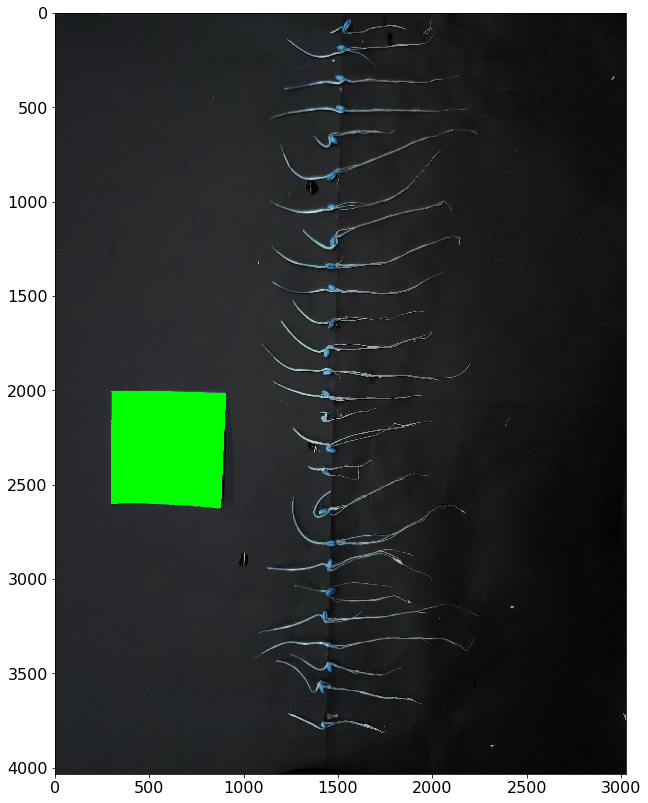

27
7.541244813530864
...LOOKING FOR SEEDS POSITION...


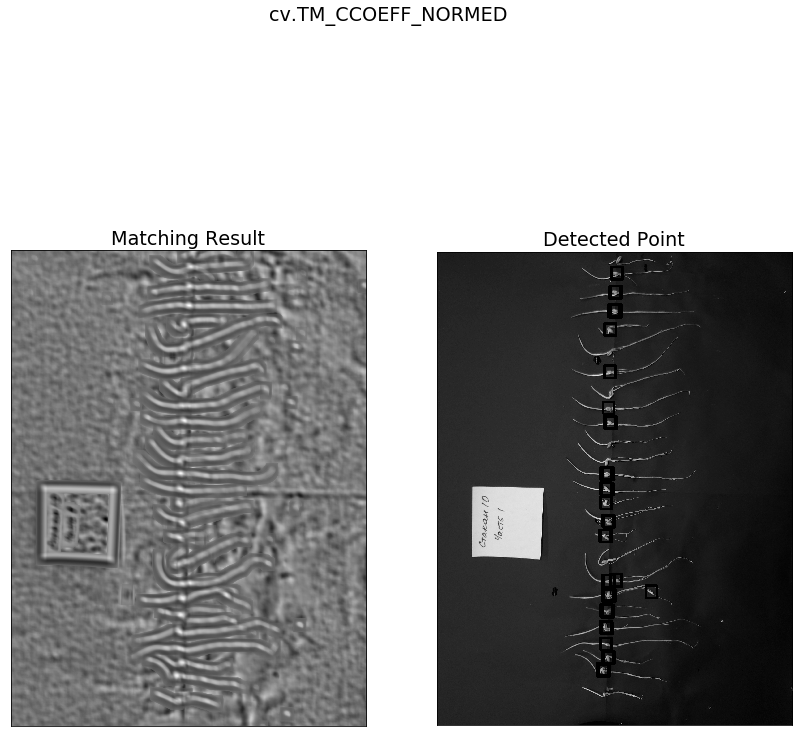

...MAKING COLOR...
(4032, 3024, 3)
mean_left_x =  1425 mean_right_x  = 1495
...WIDTH CALCULATION...
...PIXEL COUNTING...


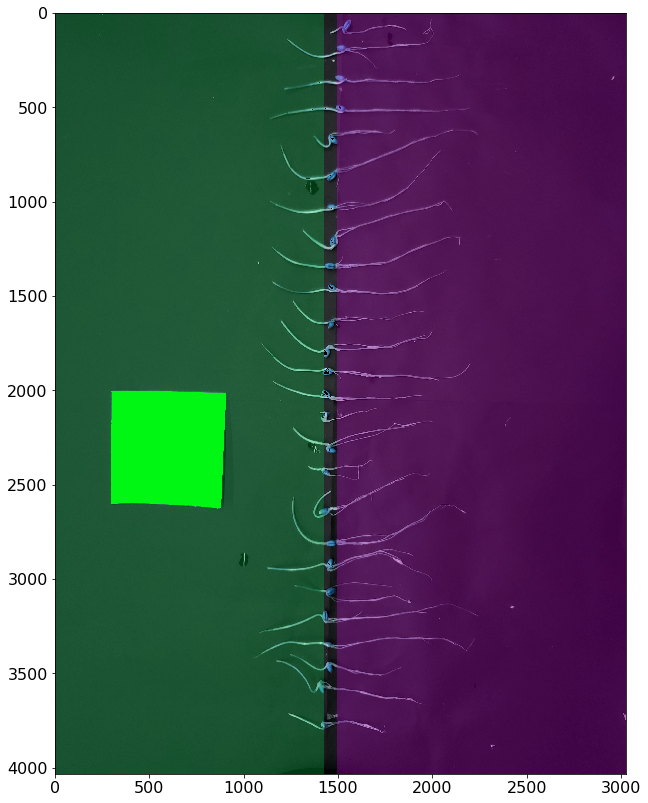

...LOOKING FOR CONTOURS...
7.510991785146554


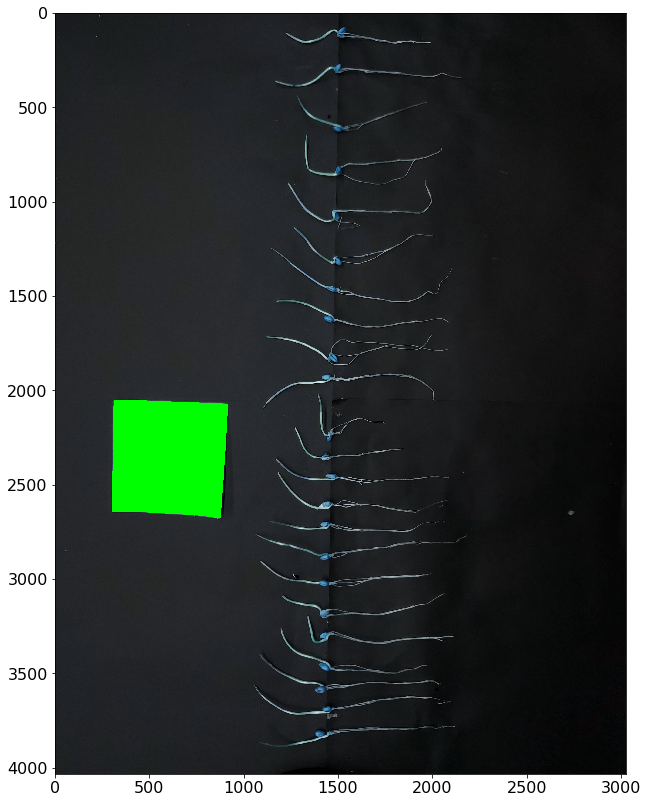

23
7.510991785146554
...LOOKING FOR SEEDS POSITION...


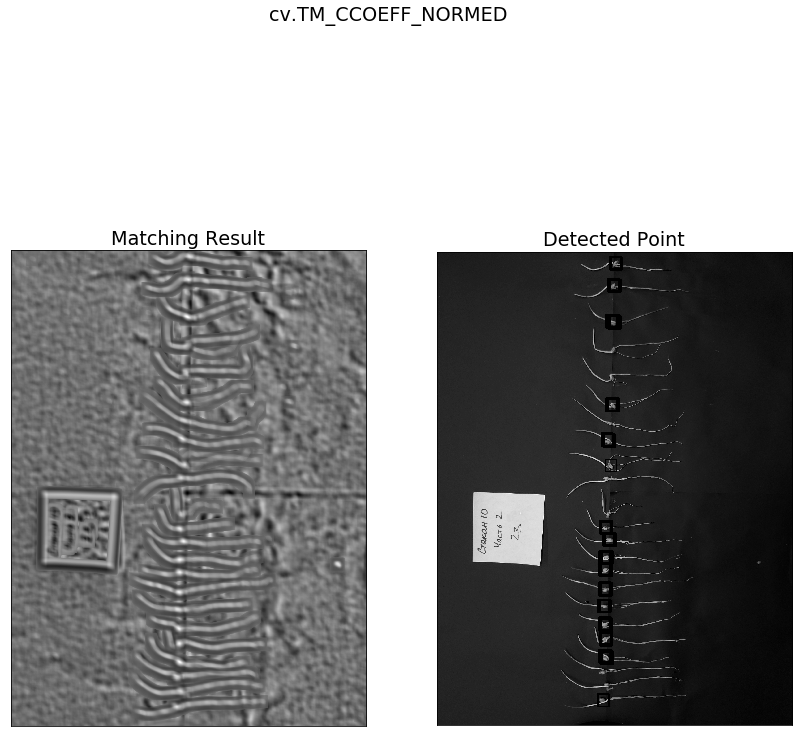

...MAKING COLOR...


In [ ]:
import math
import imutils
from imutils import contours
from scipy.spatial import distance as dist
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
from os import path, listdir
import time
start_time = time.clock()

def midpoint(ptA, ptB):
    return ((ptA[0] + ptB[0]) * 0.5, (ptA[1] + ptB[1]) * 0.5)

measure_full2 = pd.DataFrame(columns=[],index=np.arange(30))
# ppm - pixel per metric, массив с коэфам пересчета пикселя в мм, на случай плохого поиска стикера на фото

folders_list = folders_list_function(path_to_file_folder_fixed)
# pic_num=0
for g in folders_list:
    path_to_file_folder = path.join(path_to_file_folder_fixed, str(g)+'/')
    for filename_in_folder in listdir(path_to_file_folder):
        
        if filename_in_folder=='.ipynb_checkpoints':
            continue
#         pic_num +=1
#         if pic_num>3:
#             continue
        ### CONTOURS ###

        print('...LOOKING FOR CONTOURS...')

        file_name = path.join(path_to_file_folder, filename_in_folder)
        
        ### Plant contour ####       

        src = cv.imread(file_name)
#         src = cv.rotate(src, cv.ROTATE_180)
        gr = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
        bl=cv.GaussianBlur(src,(gs,gs),0)
        canny = cv.Canny(bl, c_bottom, c_top)
        kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (morph,morph))
        closed = cv.morphologyEx(canny, cv.MORPH_CLOSE, kernel)
        contours0 = cv.findContours(closed.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)[0]
        # contours0 = contours0[0] if imutils.is_cv2() else contours0[1]
        (contours0, _) = contours.sort_contours(contours0)
        pixelsPerMetric = None
        quantity_of_plants = 0
        real_conts = []
        
        pixelsPerMetric = find_paper(src,paper_square,paper_square_thresold, position_x_axes(src,x_pos_divider),
                                     canny_top=c_top, canny_bottom=c_bottom,morf=morph)
        
        for cont in contours0:
            if (cv.contourArea(cont)>contour_square_threshold):
                center, radius = cv.minEnclosingCircle(cont) #recomended range of plants position is between 1/3 and 2/3
                if ((cv.contourArea(cont) > contour_square_threshold)&
                    (center[0] > src.shape[1]//3)&(center[0] < src.shape[1]*2//3)):
                    real_conts.append(cont)
#                     cv.drawContours(src,[cont],0,(255,255,5),2)
      
        quantity_of_plants = len(real_conts)
        print(quantity_of_plants)
        print(pixelsPerMetric)

        ### SEEDS ###

        print('...LOOKING FOR SEEDS POSITION...')

        img2 = cv.imread(file_name,0)
#         img2 = cv.rotate(img2, cv.ROTATE_180)
        template = cv.imread(template_filename,0)
    #         template = cv.cvtColor(template, cv.COLOR_BGR2GRAY)
        w, h = template.shape[::-1]

        # All the 6 methods for comparison in a list
        # methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
        #             'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']
        methods = ['cv.TM_CCOEFF_NORMED']
        for meth in methods:
            img = img2.copy()
            method = eval(meth)
            # Apply template Matching
            res = cv.matchTemplate(img,template,method)
            threshold = 0.55
            loc = np.where( res > threshold)
            numbers0=[]
            for pt in zip(*loc[::-1]):
                if (pt[0] > src.shape[1]/3)&((pt[0] < 2*src.shape[1]/3)):
                    numbers0.append(pt[0])
                    cv.rectangle(img, pt, (pt[0] + w, pt[1] + h), (0,0,255), 5)

            plt.figure(figsize = (14,14))
            plt.subplot(121),plt.imshow(res,cmap = 'gray')
            plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
            plt.subplot(122),plt.imshow(img,cmap = 'gray')
            plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
            plt.suptitle(meth)
            plt.show()
            numbers = pd.Series(numbers0)
            Mean = numbers.mean()
            Median = numbers.median()
            Mode = numbers.mode()[0]   
            mean_left_x = int(Mode)+w//4
            mean_right_x = mean_left_x + 3*w//4
            mean_left_x = round(mean_left_x)
            mean_right_x = round(mean_right_x)

        src = drop_seeds(src,hsb,hst,ssb,sst,vsb,vst)
        src_black_seeds = src.copy()
        src_black_seeds = cv.cvtColor(src_black_seeds, cv.COLOR_BGR2HSV)
        ### COLOR ###

        print('...MAKING COLOR...')

        overlay = src.copy()
        cv.rectangle(overlay, (0,src.shape[0]), (mean_left_x, 0), (0,224,79), -1)
        opacity = 0.25
        cv.rectangle(overlay, (mean_right_x, src.shape[0]), (src.shape[1],0), (240,0,255), -5)
        cv.addWeighted(overlay, opacity, src, 1 - opacity, 0, src)
        bl = cv.medianBlur(src, 7)
        bl=cv.GaussianBlur(bl,(5,   5),0)
        img_hsv = cv.cvtColor(bl, cv.COLOR_BGR2HSV)
        cv.imwrite('colored/{0}'.format(filename_in_folder), src)
        print(src.shape)
        print('mean_left_x = ', mean_left_x, 'mean_right_x  =', mean_right_x)

        ## WIDTH ###

        print('...WIDTH CALCULATION...')
        measure = pd.DataFrame(columns=['roots_area_{0}'.format(file_name), 'leaves_area_{0}'.format(file_name),
                                        'roots_length_{0}'.format(file_name), 'leaves_length_{0}'.format(file_name),
                                        'roots_width_{0}'.format(file_name), 'leaves_width_{0}'.format(file_name),
                                       'plant_area_{0}'.format(file_name),'seed_area_{0}'.format(file_name)],
                               index=np.arange(len(real_conts)))

        
        for i in range(quantity_of_plants):
            is_first = True
            is_first_r = True
            roots = 0
            leaves = 0
            lamount = 0
            ramount = 0
            c = real_conts[i]
            left = tuple(c[c[:, :, 0].argmin()][0])
            right = tuple(c[c[:, :, 0].argmax()][0])
            top = tuple(c[c[:, :, 1].argmin()][0])
            bottom = tuple(c[c[:, :, 1].argmax()][0])
            cv.line(img_hsv, left, right, (255, 255, 255), thickness=2)
            step = (right[0]-mean_right_x)//3
            if (mean_right_x-left[0])//3!=0:                
                for y in range(left[0],mean_left_x,(mean_right_x-left[0])//3):
                    is_first = True
                    for x in range(top[1],bottom[1]):#иттерация по вертикали, т к img.shape => (height, width), но компонента контура (х,у)
                        h, s, v = img_hsv[x, y]
                        if (cv.pointPolygonTest(real_conts[i],(x,y), False)):
                            if (v>vlb)&(h>hlb)&(h<hlt):
                                lamount = lamount + 1*is_first
                                is_first = False
                                leaves += 1
                            else:
                                is_first = True
                        else:
                            is_first = True
            else:
                leaves_width = 0 

            if step!=0:
                for y in range(mean_right_x, right[0],step):#идем по ввертикальным линиям   
                    ramount+=1
                    for x in range(top[1],bottom[1]):#иттерация по вертикали, т к img.shape => (height, width), но компонента контура (х,у)
                        h, s, v = img_hsv[x, y]
                        if (cv.pointPolygonTest(real_conts[i],(x,y), False)):# если точка внутри контура
                            if (v>vrb)&((h>hrb)&(h<hrt)):# если эта точка = корень, а не фон 
#                                 ramount = ramount + 1*is_first_r#если это первое вхождение корня, то число корней+=1
                                is_first_r = False#далее вхождение уже не первое
                                roots += 1#число пикселей +=1
                            else:
                                is_first_r = True #если это не корень а фон, то вхождения нет
                        else:
                            is_first_r = True#если это не в контуре, то вхождения точно нет
            if (lamount == 0.0)|(lamount == 0):
        #         lamount = measure['leaves_width'].iloc[i-1]
                leaves_width = 0
            else: 
                leaves_width = leaves/lamount

            if (ramount == 0.0)|(ramount == 0)|(step == 0):
        #         ramount = measure['roots_width'].iloc[i-1]
                roots_width = 0
            else:
                roots_width = roots/ramount

    #             print( i, '\n')
    #             print("roots = ", roots, '\n', 'leaves = ', leaves)
    #             print("roots_w = ", roots_width, 
    #                   '\n', 'leaves_w = ', leaves_width, '\n')
    #             print('r_amount = ',ramount, "\n l_amount", lamount)
            measure['roots_width_{0}'.format(file_name)].iloc[i] = roots_width
            measure['leaves_width_{0}'.format(file_name)].iloc[i]= leaves_width
#             measure['leaves_width_{0}'.format(file_name)] = measure['roots_width_{0}'.format(file_name)]*2

        ### PIXEL COUNTING ###

        print('...PIXEL COUNTING...')

        for i in range(len(real_conts)):
            c = real_conts[i]
            measure.iloc[i]['plant_area_{0}'.format(file_name)] = cv.contourArea(c)
#             measure.iloc[i]['seed_area_{0}'.format(file_name)] = seed_area
        measure['leaves_area_{0}'.format(file_name)] =color_range_counter(src, real_conts, hlb,hlt,slb,slt,vlb,vlt)
        measure['roots_area_{0}'.format(file_name)] =color_range_counter(src, real_conts, hrb,hrt,srb,srt,vrb,vrt)
        measure['seed_area_{0}'.format(file_name)] =color_range_counter(src_black_seeds, real_conts, 0,1,0,1,0,1)
        measure['plant_area_{0}'.format(file_name)] = measure['plant_area_{0}'.format(file_name)]-measure['seed_area_{0}'.format(file_name)]
        measure['plant_area_{0}'.format(file_name)] = measure.apply(lambda x: x['plant_area_{0}'.format(file_name)]/(pixelsPerMetric*pixelsPerMetric), axis = 1 )
        measure['roots_length_{0}'.format(file_name)] = measure['roots_area_{0}'.format(file_name)] 
        measure['leaves_length_{0}'.format(file_name)] = measure['leaves_area_{0}'.format(file_name)] 
        
        measure['roots_length_{0}'.format(file_name)] = measure.apply(lambda x: length(x['roots_width_{0}'.format(file_name)],x['roots_length_{0}'.format(file_name)],pixelsPerMetric), axis = 1 )
        measure['leaves_length_{0}'.format(file_name)] = measure.apply(lambda x: length(x['leaves_width_{0}'.format(file_name)],x['leaves_length_{0}'.format(file_name)],pixelsPerMetric), axis = 1 )
        measure_full2 = measure_full2.join(measure, how = 'outer')
        # r_mean = measure['roots_width'].mean()
        # l_mean = measure['leaves_width'].mean()
    #         measure_full['roots_length_{0}'.format(file_name)] = measure_full.apply(lambda x: x['roots_length_{0}'.format(file_name)]/(pixelsPerMetric), axis = 1 )
    #         measure_full['leaves_length_{0}'.format(file_name)] = measure_full.apply(lambda x: x['leaves_length_{0}'.format(file_name)]/(pixelsPerMetric), axis = 1 )


        plt.figure(figsize = (14,14))
        plt.imshow(src)
        plt.show()
print ("{:g} s".format(time.clock() - start_time))

del res,bl,overlay, img, img2, img_hsv, gr, canny, src, closed, src_black_seeds


In [52]:
pd.set_option('display.max_columns', None)
measure_full2
# (measure_full2['seed_area_120422/1/20220412_133002.jpg'] - measure_full2['Funct_seeds_area_120422/1/20220412_133002.jpg'])/70

## Save and preparing

In [69]:
# measure_full2.to_csv('120422_bad.csv')

path_to_file_folder_fixed = 'photos/'
leaves_dict, roots_dict, roots_area_dict, plant_area_dict = files_dicts(path_to_file_folder_fixed)


In [426]:
measure_full2 = pd.read_csv('120422_bad.csv')

## Histogramm

C:\Users\dasha\anaconda3\lib\site-packages\ipykernel_launcher.py:51: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.


5day  mean = 40
6day  mean = 59
7day  mean = 77


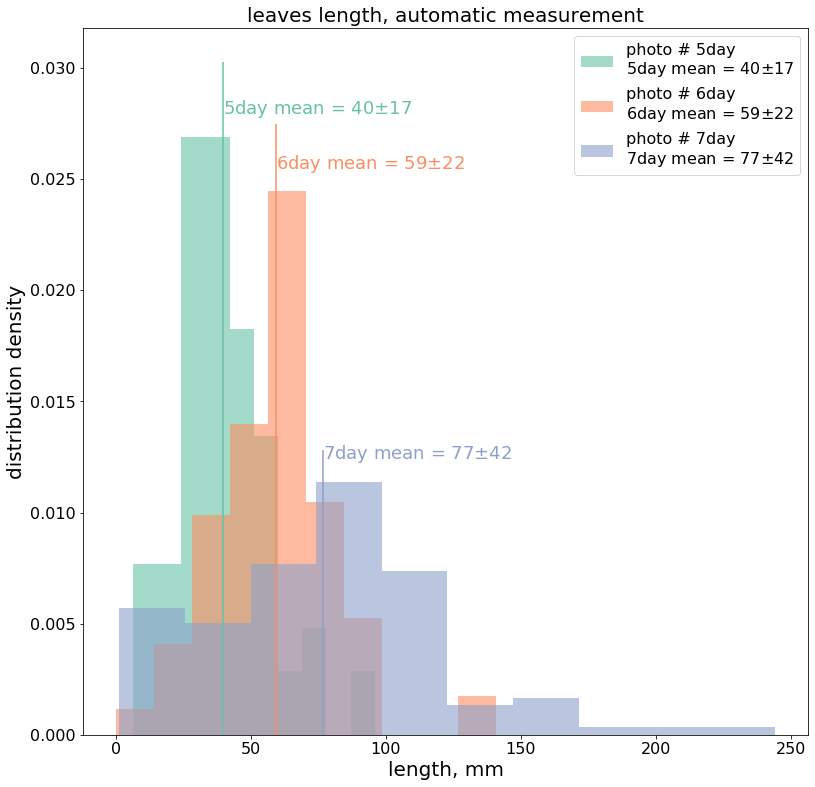

5day  mean = 68
6day  mean = 91
7day  mean = 76


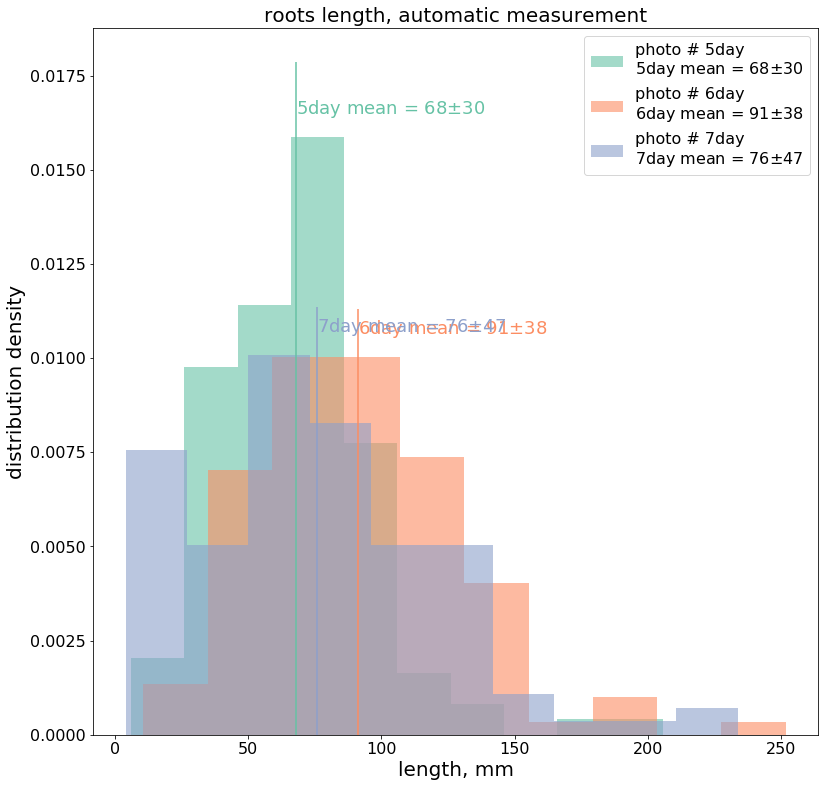

In [161]:
histodram('leaves', 3, measure_full2, leaves_dict, False)
histodram('roots', 3, measure_full2, roots_dict, False)

C:\Users\dasha\anaconda3\lib\site-packages\ipykernel_launcher.py:51: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.


5day  mean = 184
6day  mean = 236
7day  mean = 290


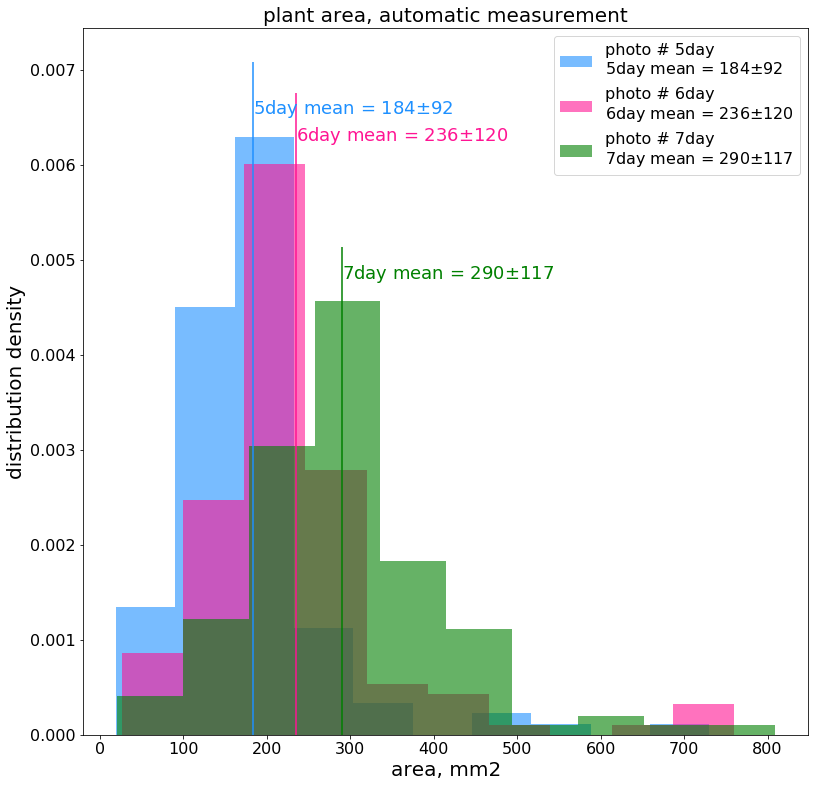

In [27]:
color_list = ['dodgerblue', 'deeppink', 'g', 'r', 'navy' ]
k=0
color_dict={}
for i in folders_list:
    color_dict[i] = color_list[k]
    k+=1

histodram('plant', color_dict, measure_full2, plant_area_dict, False,
          top_border=1000, xlabel= 'area, mm2' , param= 'area')


## Stat analysis

In [31]:
shap =shapiro_test(measure_full2, leaves_dict, roots_dict, False)
shap

,test_value
5dayleaves,5.27265e-07
6dayleaves,0.000197893
7dayleaves,0.00183106
5dayroots,0.000278082
6dayroots,0.000416925
7dayroots,0.00020442


In [70]:
p_value_table = p_value_function(measure_full2, roots_dict, leaves_dict, False)
p_value_table

,5dayroots,6dayroots,7dayroots,5dayleaves,6dayleaves,7dayleaves
5dayroots,1,0.857623,0.209769,.,.,.
6dayroots,0.857623,1,0.0346482,.,.,.
7dayroots,0.209769,0.0346482,1,.,.,.
5dayleaves,.,.,.,1,0.954026,0.110576
6dayleaves,.,.,.,0.954026,1,0.00227006
7dayleaves,.,.,.,0.110576,0.00227006,1


In [148]:
p_value_table_plants = p_value_function(measure_full2, plant_area_dict, plant_area_dict, False)
p_value_table_plants

,5dayroots,6dayroots,7dayroots,5dayleaves,6dayleaves,7dayleaves
5dayroots,1,0.00215176,2.0379e-10,.,.,.
6dayroots,0.00215176,1,0.000413652,.,.,.
7dayroots,2.0379e-10,0.000413652,1,.,.,.
5dayleaves,.,.,.,1,0.00215176,2.0379e-10
6dayleaves,.,.,.,0.00215176,1,0.000413652
7dayleaves,.,.,.,2.0379e-10,0.000413652,1


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

6day vs. 7day: p-value=3.89e-02
5day vs. 7day: p-value=4.85e-02


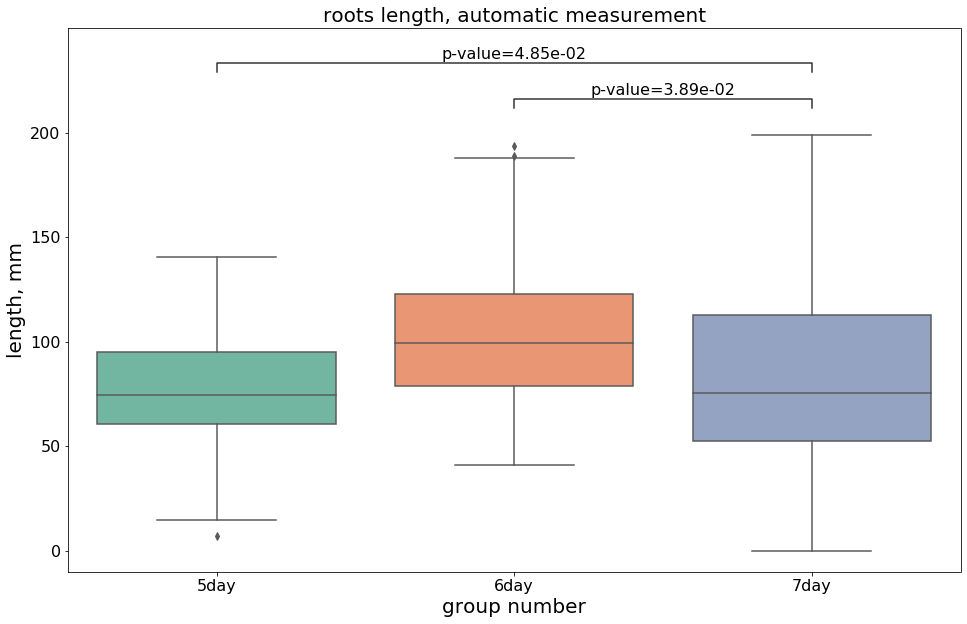

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

6day vs. 7day: p-value=3.56e-04
5day vs. 7day: p-value=5.58e-10


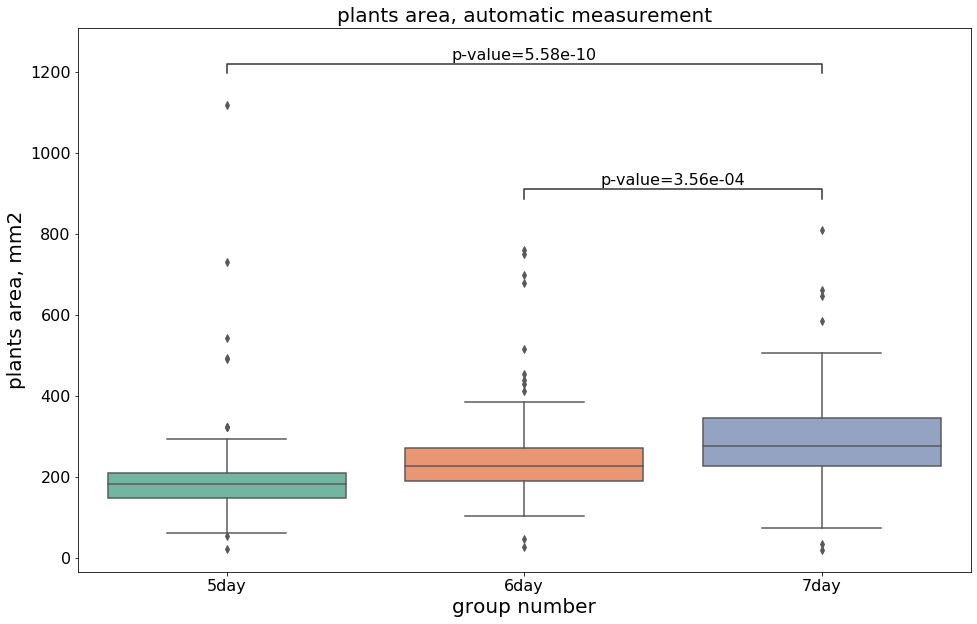

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

6day vs. 7day: p-value=7.79e-05
5day vs. 7day: p-value=1.91e-16


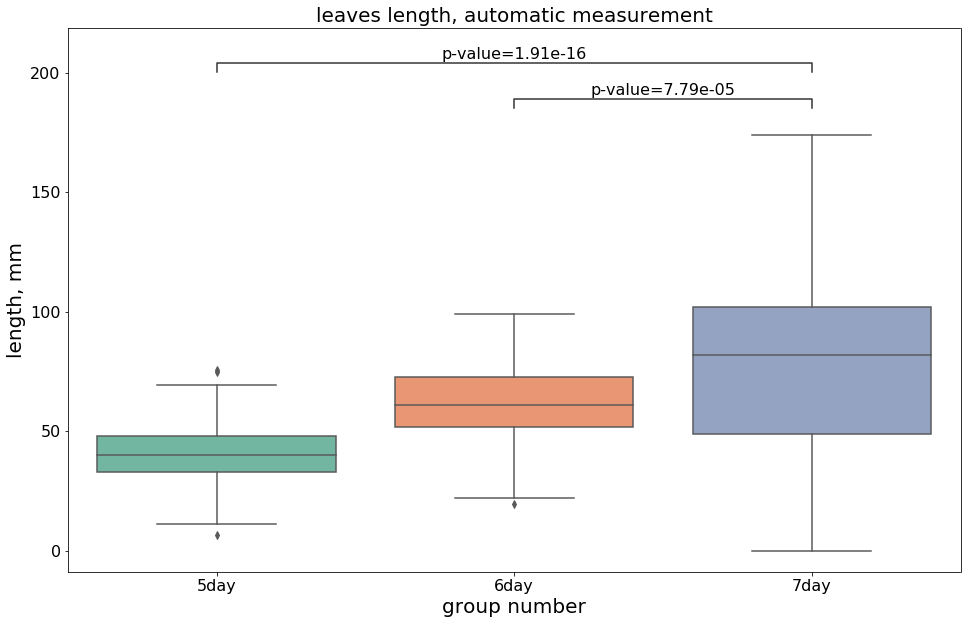

,5day,6day,7day
0,44.675338,97.435758,13.608394
1,37.502181,89.958480,NaN
2,55.329688,61.193367,150.726052
3,NaN,83.137437,107.141597
4,53.748801,84.012391,110.960414
...,...,...,...
125,NaN,NaN,0.000000
126,13.590430,43.343130,NaN
127,32.666303,31.706551,29.310474
128,NaN,NaN,NaN


In [34]:
box_plot_function('roots', 10,measure_full2, roots_dict, p_value_table, '7day',
                              is_save = False, is_drop_outliers= True)
box_plot_function('plants', 10, measure_full2, plant_area_dict, p_value_table_plants, '7day',
                              is_save = False, ylabel='plants area, mm2', param= 'area')
box_plot_function('leaves', 10, measure_full2, leaves_dict, p_value_table, '7day',
                              is_save = False, is_drop_outliers=True)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

6day vs. 7day: p-value=6.18e-03
5day vs. 7day: p-value=1.58e-01


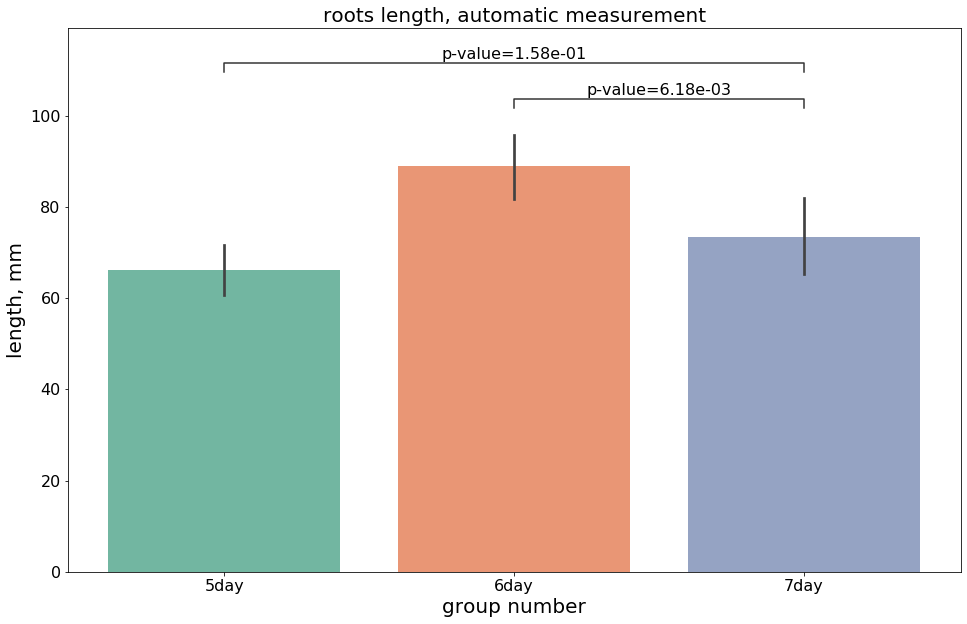

In [163]:
bar_plot_function('roots', 5, measure_full2, roots_dict, p_value_table, '7day',
                              is_save=False, union_DF_length=250)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

6day vs. 7day: p-value=3.89e-02
5day vs. 7day: p-value=4.85e-02


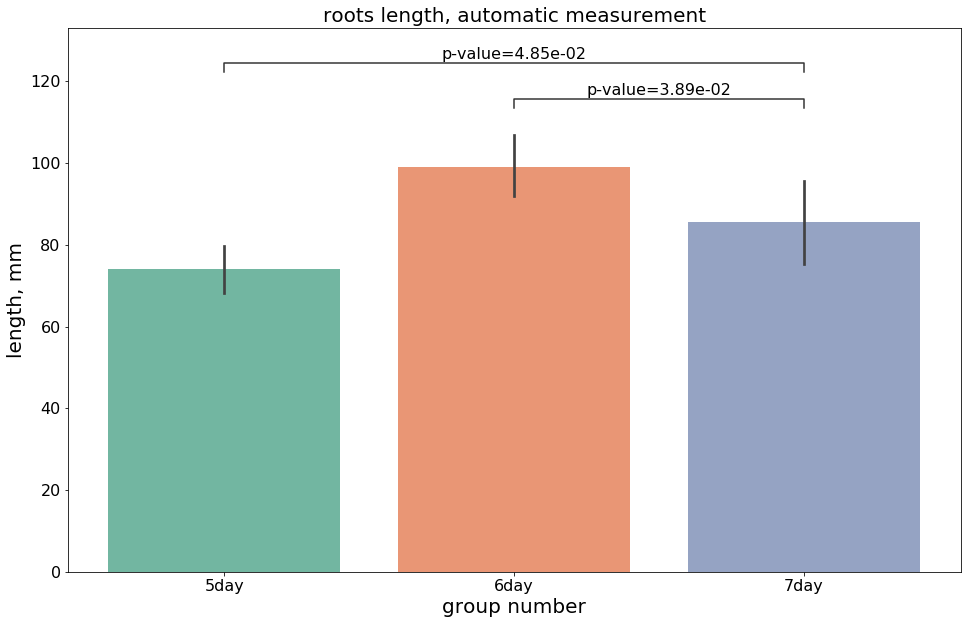

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

6day vs. 7day: p-value=7.79e-05
5day vs. 7day: p-value=1.91e-16


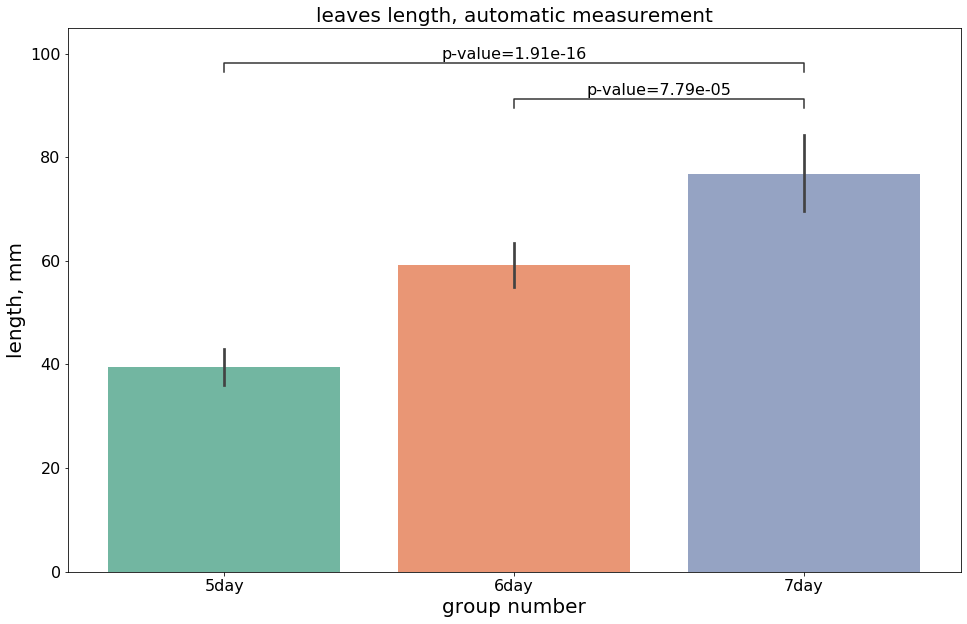

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

6day vs. 7day: p-value=3.56e-04
5day vs. 7day: p-value=5.58e-10


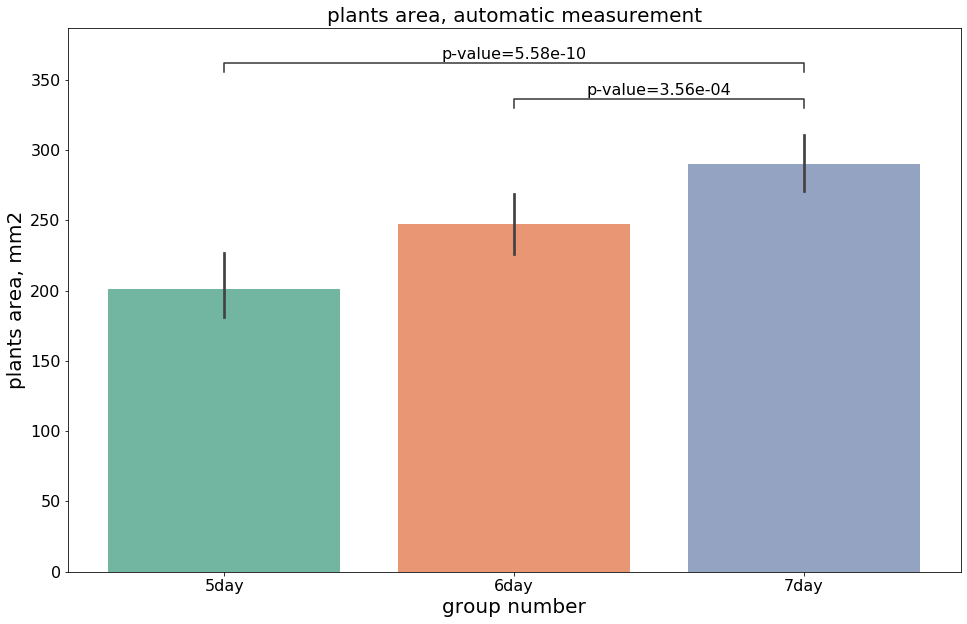

In [36]:
bar_plot_function('roots', 5, measure_full2, roots_dict, p_value_table, '7day',
                              is_save=True, figname = 'wheat120422_bar_r_at020822.jpg', union_DF_length=250)
bar_plot_function('leaves', 5, measure_full2, leaves_dict, p_value_table, '7day',
                              is_save=True, figname = 'wheat120422_bar_l_at020822.jpg', union_DF_length=250)
bar_plot_function('plants', 10, measure_full2, plant_area_dict, p_value_table_plants, '7day',
                              is_save=True, figname = 'wheat120422_bar_p_at020822.jpg', ylabel='plants area, mm2', param= 'area')

# Main.MANUAL

In [110]:
real = pd.read_csv('растения - ветки.csv')
real_leaves = pd.DataFrame(columns=['7day','6day','5day'])

real_leaves['5day'] =  pd.DataFrame(pd.Series(real[real.columns[12:]].values.reshape(-1)).dropna())[0]
real_leaves['7day'] =  pd.DataFrame(pd.Series(real[real.columns[:6]].values.reshape(-1)).dropna())[0]
real_leaves['6day'] =  pd.DataFrame(pd.Series(real[real.columns[6:12]].values.reshape(-1)).dropna())

real_leaves.std()

7day    21.211887
6day    16.717072
5day    12.731974
dtype: float64

In [111]:
real = pd.read_csv('корни.csv')
real_roots = pd.DataFrame(columns=['7day','6day','5day'])

real_roots['7day'] =  pd.DataFrame(pd.Series(real[real.columns[:6]].values.reshape(-1)).dropna())[0]
real_roots['5day'] =  pd.DataFrame(pd.Series(real[real.columns[12:]].values.reshape(-1)).dropna())[0]
real_roots['6day'] =  pd.DataFrame(pd.Series(real[real.columns[6:12]].values.reshape(-1)).dropna())

real_roots.std()

7day    24.484194
6day    18.563636
5day    15.300351
dtype: float64

In [155]:
pvalue_table_real = pd.DataFrame(index = list(str(x)+'roots' for x in roots_max_dict.keys())+list(str(x)+'leaves' for x in leaves_dict.keys()),
                            columns=list(str(x)+'roots' for x in roots_max_dict.keys())+list(str(x)+'leaves' for x in leaves_dict.keys()))
for i in (list(roots_max_dict.keys())):
    for j in (list(roots_max_dict.keys())):
        pvalue_table_real[str(i)+'roots'].loc[str(j)+'roots'] = scipy.stats.ttest_ind(pd.Series(real_roots[str(i)].values.reshape(-1)).dropna(),
                                                        pd.Series(real_roots[str(j)].values.reshape(-1)).dropna())[1]
for i in (list(leaves_dict.keys())):
    for j in (list(leaves_dict.keys())):
        pvalue_table_real[str(i)+'leaves'].loc[str(j)+'leaves'] = scipy.stats.ttest_ind(pd.Series(real_leaves[str(i)].values.reshape(-1)).dropna(),
                                                        pd.Series(real_leaves[str(j)].values.reshape(-1)).dropna())[1]
pvalue_table_real.fillna(value='.', inplace = True)
pvalue_table_real

,5dayroots,6dayroots,7dayroots,5dayleaves,6dayleaves,7dayleaves
5dayroots,1,1.04813e-16,1.57374e-23,.,.,.
6dayroots,1.04813e-16,1,0.000764444,.,.,.
7dayroots,1.57374e-23,0.000764444,1,.,.,.
5dayleaves,.,.,.,1,1.10259e-16,8.31259e-43
6dayleaves,.,.,.,1.10259e-16,1,3.04508e-15
7dayleaves,.,.,.,8.31259e-43,3.04508e-15,1


In [75]:
real_leaves.columns

Index(['1', '2', '3', '4', '5'], dtype='object')

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

7day vs. 6day: p-value=1.05e-16
7day vs. 5day: p-value=1.57e-23


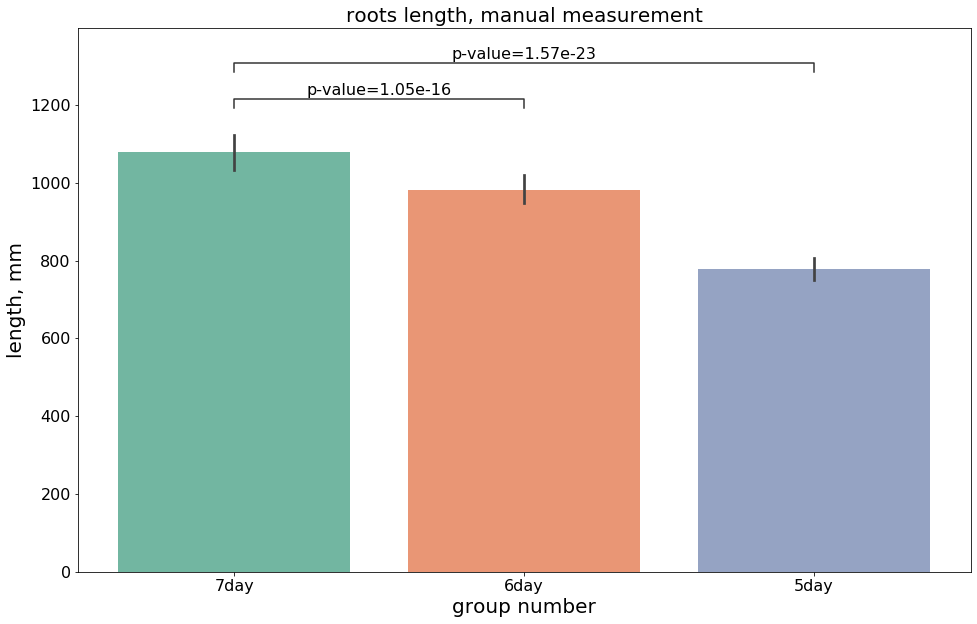

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

7day vs. 6day: p-value=1.10e-16
7day vs. 5day: p-value=8.31e-43


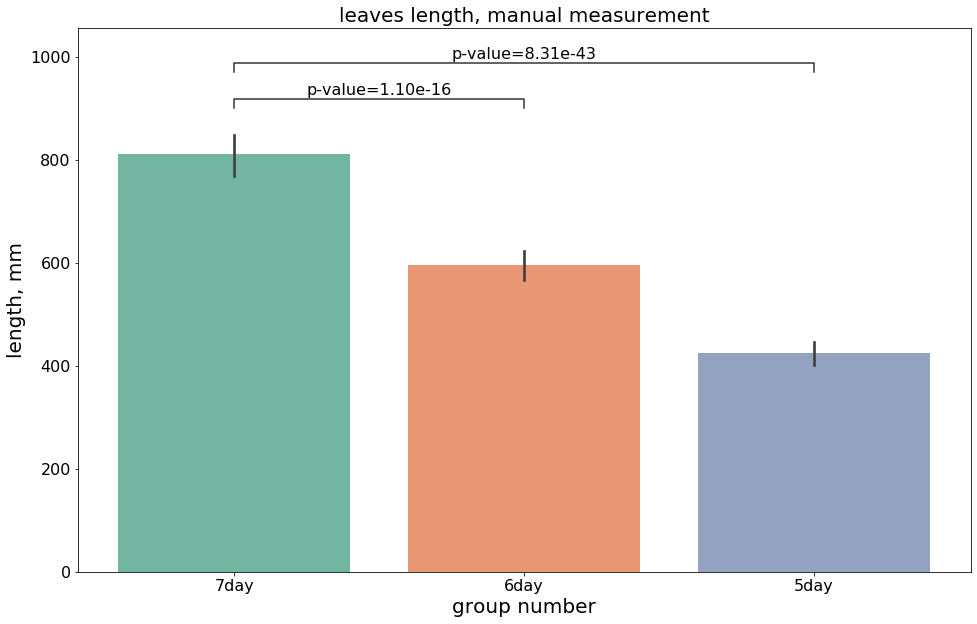

In [157]:
bar_plot_function('roots', 5, real_roots*10, ['7day','6day','5day'], pvalue_table_real,'7day',
                              is_save=False, auto_or_man = 'manual')
bar_plot_function('leaves', 5, real_leaves*10, ['7day','6day','5day'], pvalue_table_real, '7day',
                              is_save= False, auto_or_man = 'manual')

# Auto VS Manual

In [ ]:
tmp_r = box_plot_function('roots', 10,measure_full2, roots_dict, p_value_table, '7day',
                              is_save = False)
tmp_l = box_plot_function('leaves', 10,measure_full2, leaves_dict, p_value_table, '7day',
                              is_save = False)

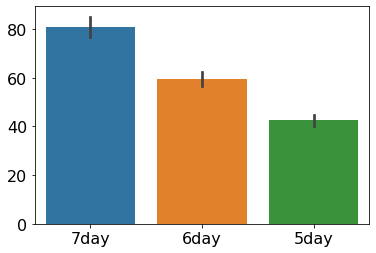

In [135]:
sns.barplot(data = real_leaves)

In [72]:
def many_df(real_df, auto_df):
    m_1 = pd.DataFrame(columns=['data','a_or_m','group'])
    m_1['data'] = real_df['7day']
    m_1['a_or_m'] = 'manual'
    m_1['group'] = '7day'
    m_1.iloc[[-1, -2]] = np.nan
    m_1.dropna(inplace = True)
    m_2 = pd.DataFrame(columns=['data','a_or_m','group'])
    m_2['data'] = real_df['6day']
    m_2['a_or_m'] = 'manual'
    m_2['group'] = '6day'
    m_2.iloc[[-1, -2]] = np.nan
    m_2.dropna(inplace = True)
    m_3 = pd.DataFrame(columns=['data','a_or_m','group'])
    m_3['data'] = real_df['5day']
    m_3['a_or_m'] = 'manual'
    m_3['group'] = '5day'
    m_3.iloc[[-1, -2]] = np.nan
    m_3.dropna(inplace = True)

    a_1 = pd.DataFrame(columns=['data','a_or_m','group'])
    a_1['data'] = auto_df['7day']
    a_1['a_or_m'] = 'auto'
    a_1['group'] = '7day'
    a_1.dropna(inplace = True)
    a_2 = pd.DataFrame(columns=['data','a_or_m','group'])
    a_2['data'] = auto_df['6day']
    a_2['a_or_m'] = 'auto'
    a_2['group'] = '6day'
    a_2.dropna(inplace = True)
    a_3 = pd.DataFrame(columns=['data','a_or_m','group'])
    a_3['data'] = auto_df['5day']
    a_3['a_or_m'] = 'auto'
    a_3['group'] = '5day'
    a_3.dropna(inplace = True)
    return a_1,a_2,a_3,m_1,m_2,m_3


In [73]:
def multy_merge(a_1,a_2,a_3,m_1,m_2,m_3):
    l = m_1.merge(m_2, how='outer')
    l = l.merge(a_1, how = 'outer')
    l = l.merge(a_2, how = 'outer')
    l = l.merge(a_3, how = 'outer')
    l = l.merge(m_3, how = 'outer')
    # l.iloc[[375,376]] = np.nan
    l.dropna(inplace=True) 
    return l

In [92]:
l

,data,a_or_m,group
0,131.0,manual,7day
1,109.0,manual,7day
2,100.0,manual,7day
3,100.0,manual,7day
4,108.0,manual,7day
...,...,...,...
692,68.0,manual,5day
693,35.0,manual,5day
694,83.0,manual,5day
695,58.0,manual,5day


In [ ]:
a_1,a_2,a_3,m_1,m_2,m_3 = many_df(real_leaves, tmp_l)
l=multy_merge(a_1,a_2,a_3,m_1,m_2,m_3)

# fig = plt.figure(figsize = (10,7))
sns.barplot(x=l['group'], y = l['data'], hue = l['a_or_m'], palette= sns.color_palette("Set2", n_colors = 5))
plt.title(r'Leaves measurement', fontsize=20)
plt.ylabel('length, mm', fontsize = 20)
# plt.savefig('765days_leaves_comparation.jpg')

Text(0, 0.5, 'length, mm')

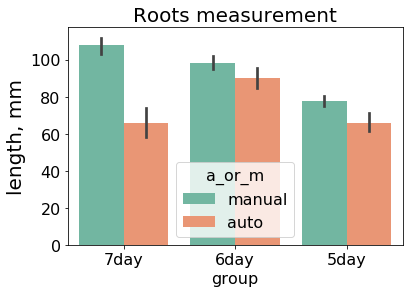

In [114]:
a_1,a_2,a_3,m_1,m_2,m_3 = many_df(real_roots, tmp_r)
l=multy_merge(a_1,a_2,a_3,m_1,m_2,m_3)

# fig = plt.figure(figsize = (10,7))
sns.barplot(x=l['group'], y = l['data'], hue = l['a_or_m'], palette= sns.color_palette("Set2", n_colors = 5))
plt.title(r'Roots measurement', fontsize=20)
plt.ylabel('length, mm', fontsize = 20)

In [ ]:
tmp = measure_full2[[i for i in measure_full2.columns if i.startswith('roots_l')]]
sns.barplot(pd.DataFrame(pd.Series(tmp.values.reshape(-1)).dropna()))

# Tests

C:\Users\dasha\anaconda3\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  # This is added back by InteractiveShellApp.init_path()


...LOOKING FOR CONTOURS...
7.941603077817581
19
7.941603077817581
...LOOKING FOR SEEDS POSITION...


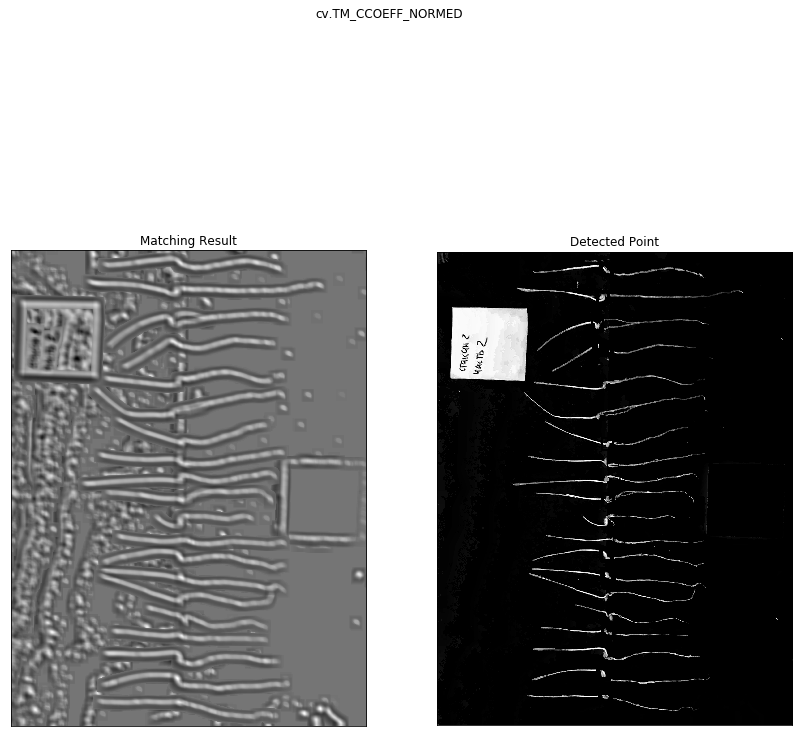

...MAKING COLOR...
(4032, 3024, 3)
mean_left_x =  1422 mean_right_x  = 1492
...WIDTH CALCULATION...
...PIXEL COUNTING...


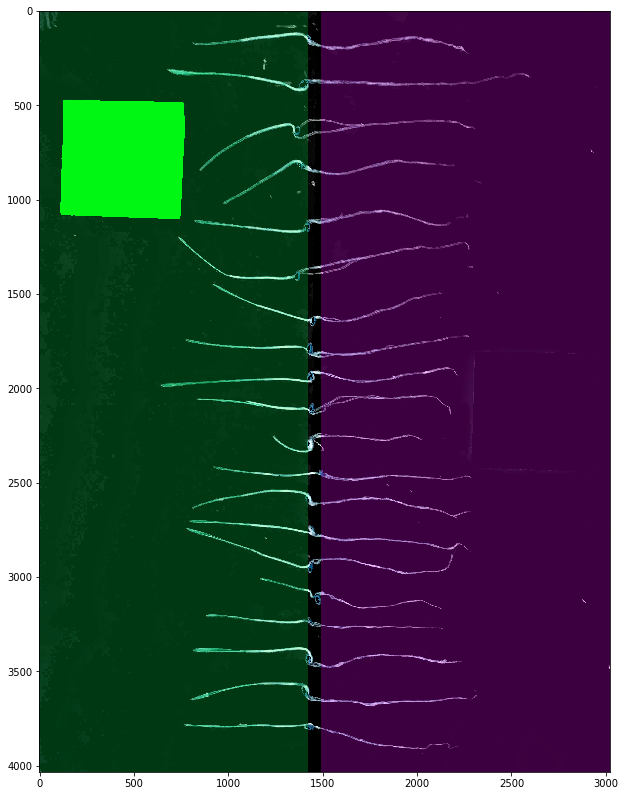

...LOOKING FOR CONTOURS...
7.212668891142021
22
7.212668891142021
...LOOKING FOR SEEDS POSITION...


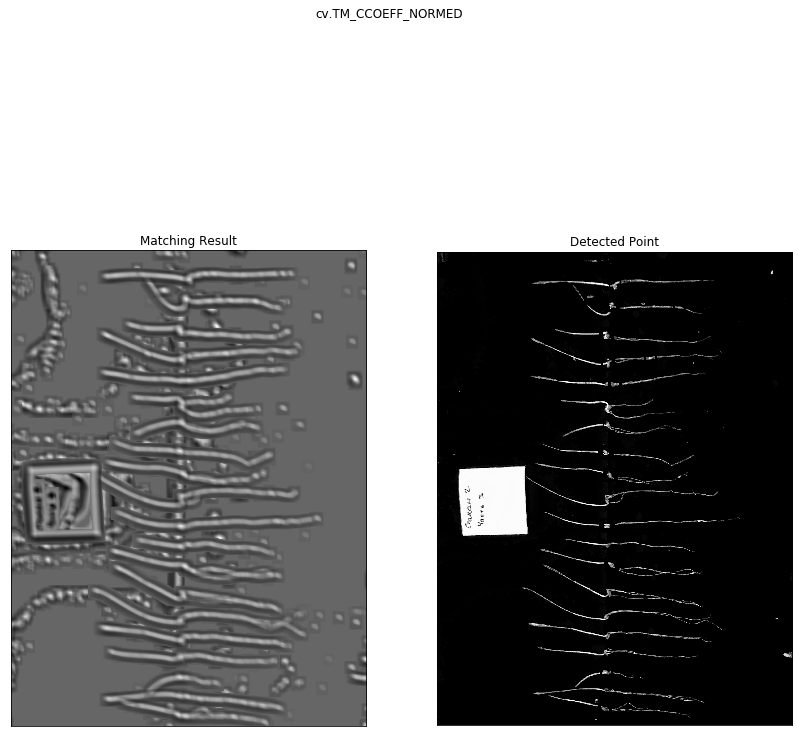

...MAKING COLOR...
(4032, 3024, 3)
mean_left_x =  1418 mean_right_x  = 1488
...WIDTH CALCULATION...
...PIXEL COUNTING...


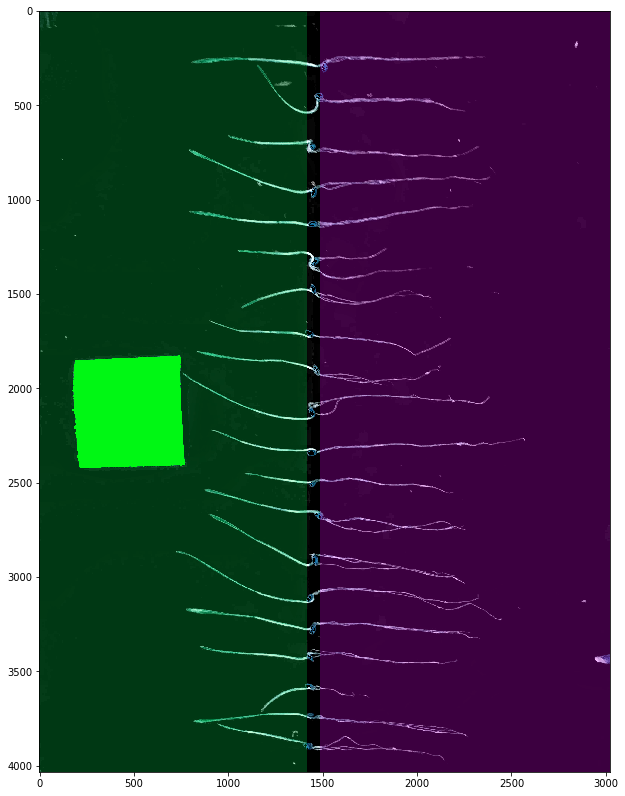

...LOOKING FOR CONTOURS...
7.210135915937637
17
7.210135915937637
...LOOKING FOR SEEDS POSITION...


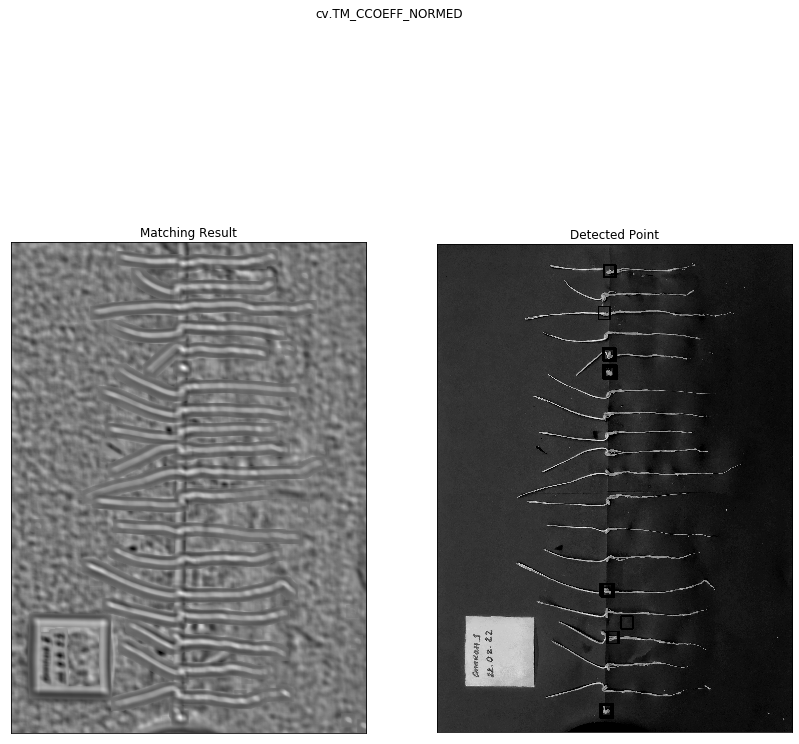

...MAKING COLOR...
(4000, 2912, 3)
mean_left_x =  1382 mean_right_x  = 1452
...WIDTH CALCULATION...
...PIXEL COUNTING...


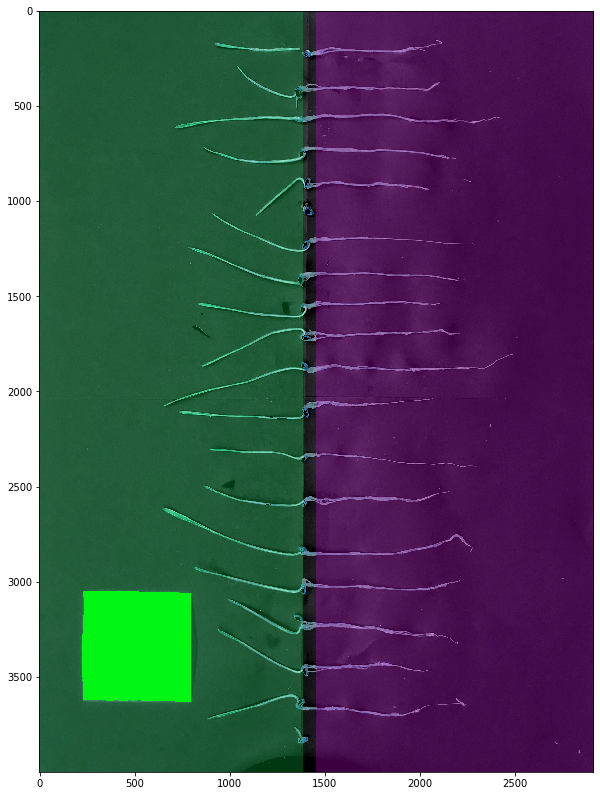

...LOOKING FOR CONTOURS...
7.415523284248664
6
7.415523284248664
...LOOKING FOR SEEDS POSITION...


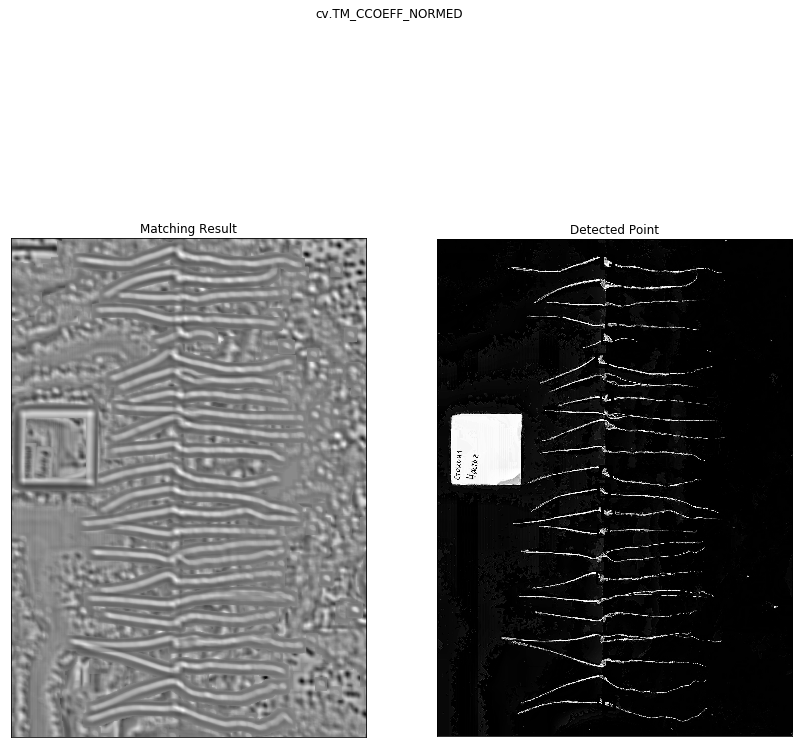

...MAKING COLOR...
(4028, 2883, 3)
mean_left_x =  1362 mean_right_x  = 1432
...WIDTH CALCULATION...
...PIXEL COUNTING...


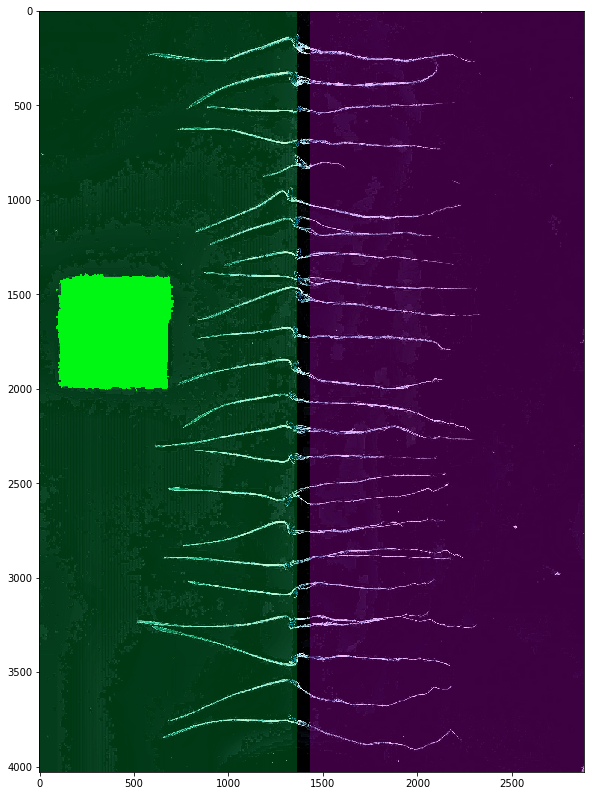

...LOOKING FOR CONTOURS...
7.664847019148576
6
7.664847019148576
...LOOKING FOR SEEDS POSITION...


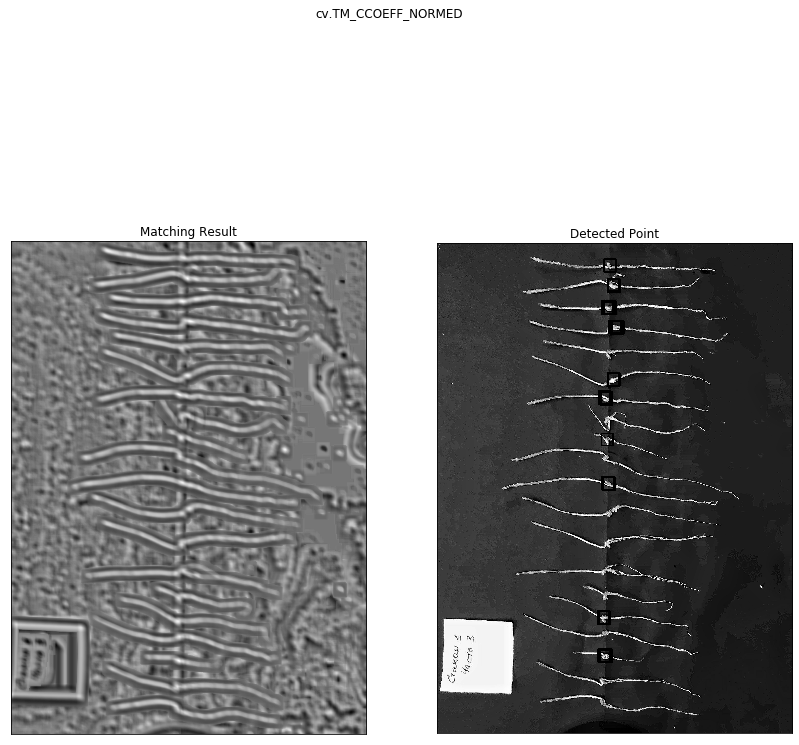

...MAKING COLOR...
(4017, 2913, 3)
mean_left_x =  1347 mean_right_x  = 1417
...WIDTH CALCULATION...
...PIXEL COUNTING...


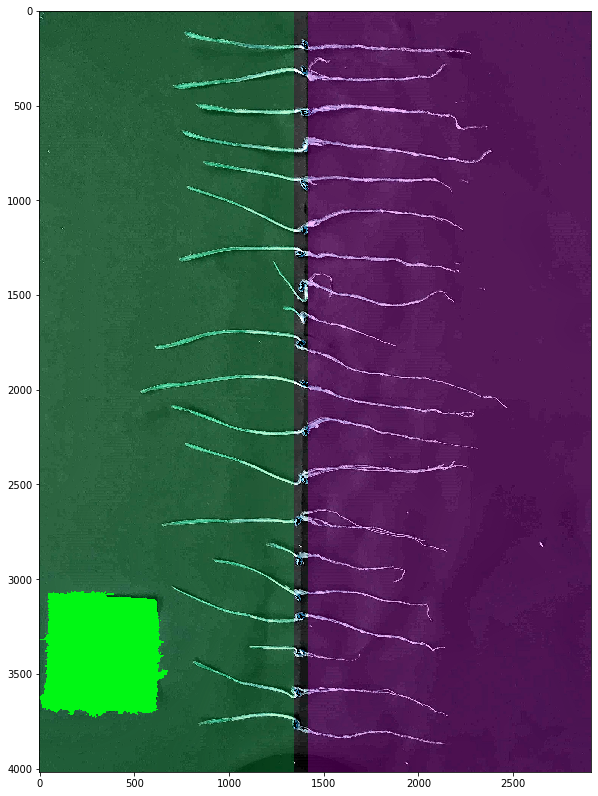

...LOOKING FOR CONTOURS...
6.069286959078139
1
6.069286959078139
...LOOKING FOR SEEDS POSITION...


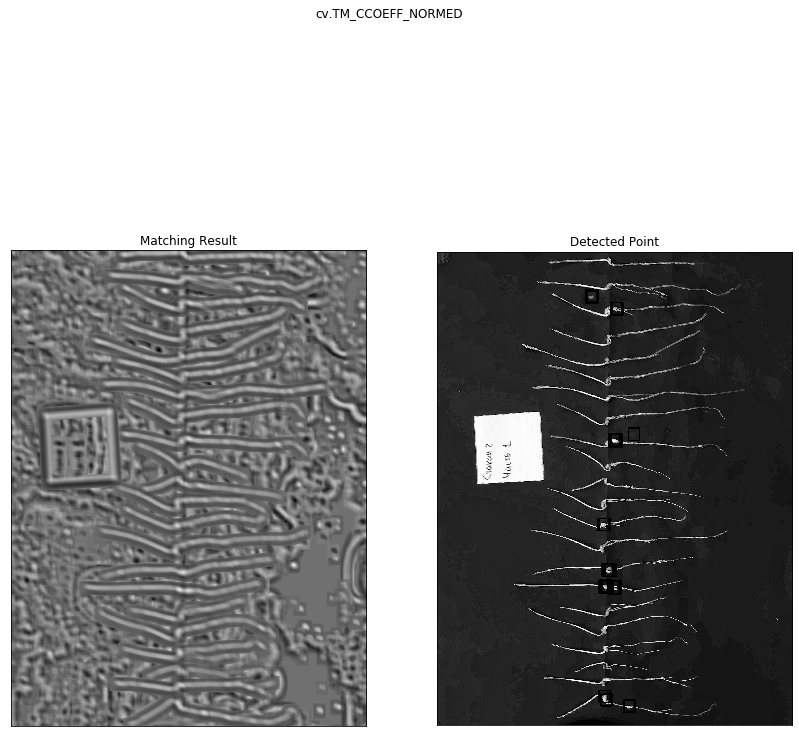

...MAKING COLOR...
(4032, 3024, 3)
mean_left_x =  1488 mean_right_x  = 1558
...WIDTH CALCULATION...
...PIXEL COUNTING...


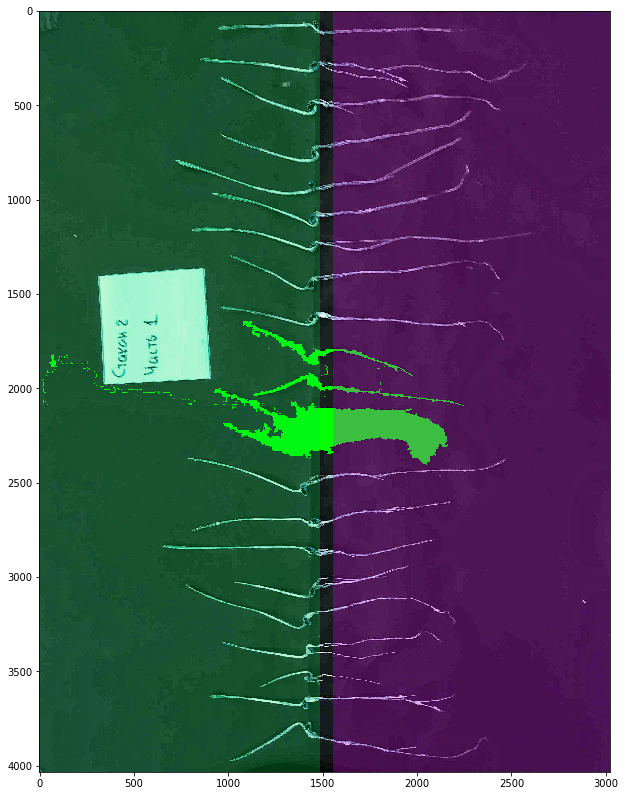

43.1746 s


C:\Users\dasha\anaconda3\lib\site-packages\ipykernel_launcher.py:233: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [56]:
import math
import imutils
from imutils import contours
from scipy.spatial import distance as dist
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
from os import path, listdir
import time
start_time = time.clock()

def midpoint(ptA, ptB):
    return ((ptA[0] + ptB[0]) * 0.5, (ptA[1] + ptB[1]) * 0.5)

measure_full = pd.DataFrame(columns=[],index=np.arange(30))
# ppm - pixel per metric, массив с коэфам пересчета пикселя в мм, на случай плохого поиска стикера на фото

folders_list = folders_list_function(path_to_file_folder_fixed)
# pic_num=0
for g in folders_list:
    path_to_file_folder = path.join(path_to_file_folder_fixed, str(g)+'/')
    for filename_in_folder in listdir(path_to_file_folder):
        
        if filename_in_folder=='.ipynb_checkpoints':
            continue
#         pic_num +=1
#         if pic_num>3:
#             continue
        ### CONTOURS ###

        print('...LOOKING FOR CONTOURS...')

        file_name = path.join(path_to_file_folder, filename_in_folder)
        
        ### Plant contour ####       

        src = cv.imread(file_name)
#         src = cv.rotate(src, cv.ROTATE_180)
        gr = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
        bl=cv.GaussianBlur(src,(gs,gs),0)
        canny = cv.Canny(bl, c_bottom, c_top)
        kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (morph,morph))
        closed = cv.morphologyEx(canny, cv.MORPH_CLOSE, kernel)
        contours0 = cv.findContours(closed.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)[0]
        # contours0 = contours0[0] if imutils.is_cv2() else contours0[1]
        (contours0, _) = contours.sort_contours(contours0)
        pixelsPerMetric = None
        quantity_of_plants = 0
        real_conts = []
        
        pixelsPerMetric = find_paper(src,paper_square,paper_square_thresold, position_x_axes(src,x_pos_divider),
                                     canny_top=c_top, canny_bottom=c_bottom,morf=morph)
        
        for cont in contours0:
            if (cv.contourArea(cont)>contour_square_threshold):
                center, radius = cv.minEnclosingCircle(cont) #recomended range of plants position is between 1/3 and 2/3
                if ((cv.contourArea(cont) > contour_square_threshold)&
                    (center[0] > src.shape[1]//3)&(center[0] < src.shape[1]*2//3)):
                    real_conts.append(cont)
#                     cv.drawContours(src,[cont],0,(255,255,5),2)
      
        quantity_of_plants = len(real_conts)
        print(quantity_of_plants)
        print(pixelsPerMetric)

        ### SEEDS ###

        print('...LOOKING FOR SEEDS POSITION...')

        img2 = cv.imread(file_name,0)
#         img2 = cv.rotate(img2, cv.ROTATE_180)
        template = cv.imread(template_filename,0)
    #         template = cv.cvtColor(template, cv.COLOR_BGR2GRAY)
        w, h = template.shape[::-1]

        # All the 6 methods for comparison in a list
        # methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
        #             'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']
        methods = ['cv.TM_CCOEFF_NORMED']
        for meth in methods:
            img = img2.copy()
            method = eval(meth)
            # Apply template Matching
            res = cv.matchTemplate(img,template,method)
            threshold = 0.55
            loc = np.where( res > threshold)
            numbers0=[]
            for pt in zip(*loc[::-1]):
                if (pt[0] > src.shape[1]/3)&((pt[0] < 2*src.shape[1]/3)):
                    numbers0.append(pt[0])
                    cv.rectangle(img, pt, (pt[0] + w, pt[1] + h), (0,0,255), 5)

            plt.figure(figsize = (14,14))
            plt.subplot(121),plt.imshow(res,cmap = 'gray')
            plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
            plt.subplot(122),plt.imshow(img,cmap = 'gray')
            plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
            plt.suptitle(meth)
            plt.show()
            numbers = pd.Series(numbers0)
            Mean = numbers.mean()
            Median = numbers.median()
            Mode = numbers.mode()[0]   
            mean_left_x = int(Mode)+w//4
            mean_right_x = mean_left_x + 3*w//4
            mean_left_x = round(mean_left_x)
            mean_right_x = round(mean_right_x)

        src = drop_seeds(src,hsb,hst,ssb,sst,vsb,vst)
        src_black_seeds = src.copy()
        src_black_seeds = cv.cvtColor(src_black_seeds, cv.COLOR_BGR2HSV)
        ### COLOR ###

        print('...MAKING COLOR...')

        overlay = src.copy()
        cv.rectangle(overlay, (0,src.shape[0]), (mean_left_x, 0), (0,224,79), -1)
        opacity = 0.25
        cv.rectangle(overlay, (mean_right_x, src.shape[0]), (src.shape[1],0), (240,0,255), -5)
        cv.addWeighted(overlay, opacity, src, 1 - opacity, 0, src)
        bl = cv.medianBlur(src, 7)
        bl=cv.GaussianBlur(bl,(5,   5),0)
        img_hsv = cv.cvtColor(bl, cv.COLOR_BGR2HSV)
        cv.imwrite('colored/{0}'.format(filename_in_folder), src)
        print(src.shape)
        print('mean_left_x = ', mean_left_x, 'mean_right_x  =', mean_right_x)

        ## WIDTH ###

        print('...WIDTH CALCULATION...')
        measure = pd.DataFrame(columns=['roots_area_{0}'.format(file_name), 'leaves_area_{0}'.format(file_name),
                                        'roots_length_{0}'.format(file_name), 'leaves_length_{0}'.format(file_name),
                                        'roots_width_{0}'.format(file_name), 'leaves_width_{0}'.format(file_name),
                                       'plant_area_{0}'.format(file_name),'seed_area_{0}'.format(file_name)],
                               index=np.arange(len(real_conts)))

        
        for i in range(quantity_of_plants):
            is_first = True
            is_first_r = True
            roots = 0
            leaves = 0
            lamount = 0
            ramount = 0
            c = real_conts[i]
            left = tuple(c[c[:, :, 0].argmin()][0])
            right = tuple(c[c[:, :, 0].argmax()][0])
            top = tuple(c[c[:, :, 1].argmin()][0])
            bottom = tuple(c[c[:, :, 1].argmax()][0])
            cv.line(img_hsv, left, right, (255, 255, 255), thickness=2)
            step = (right[0]-mean_right_x)//3
            if (mean_right_x-left[0])//3!=0:                
                for y in range(left[0],mean_left_x,(mean_right_x-left[0])//3):
                    is_first = True
                    for x in range(top[1],bottom[1]):#иттерация по вертикали, т к img.shape => (height, width), но компонента контура (х,у)
                        h, s, v = img_hsv[x, y]
                        if (cv.pointPolygonTest(real_conts[i],(x,y), False)):
                            if (v>vlb)&(h>hlb)&(h<hlt):
                                lamount = lamount + 1*is_first
                                is_first = False
                                leaves += 1
                            else:
                                is_first = True
                        else:
                            is_first = True
            else:
                leaves_width = 0 

            if step!=0:
                for y in range(mean_right_x, right[0],step):#идем по ввертикальным линиям   
                    ramount+=1
                    for x in range(top[1],bottom[1]):#иттерация по вертикали, т к img.shape => (height, width), но компонента контура (х,у)
                        h, s, v = img_hsv[x, y]
                        if (cv.pointPolygonTest(real_conts[i],(x,y), False)):# если точка внутри контура
                            if (v>vrb)&((h>hrb)&(h<hrt)):# если эта точка = корень, а не фон 
#                                 ramount = ramount + 1*is_first_r#если это первое вхождение корня, то число корней+=1
                                is_first_r = False#далее вхождение уже не первое
                                roots += 1#число пикселей +=1
                            else:
                                is_first_r = True #если это не корень а фон, то вхождения нет
                        else:
                            is_first_r = True#если это не в контуре, то вхождения точно нет
            if (lamount == 0.0)|(lamount == 0):
        #         lamount = measure['leaves_width'].iloc[i-1]
                leaves_width = 0
            else: 
                leaves_width = leaves/lamount

            if (ramount == 0.0)|(ramount == 0)|(step == 0):
        #         ramount = measure['roots_width'].iloc[i-1]
                roots_width = 0
            else:
                roots_width = roots/ramount

    #             print( i, '\n')
    #             print("roots = ", roots, '\n', 'leaves = ', leaves)
    #             print("roots_w = ", roots_width, 
    #                   '\n', 'leaves_w = ', leaves_width, '\n')
    #             print('r_amount = ',ramount, "\n l_amount", lamount)
            measure['roots_width_{0}'.format(file_name)].iloc[i] = roots_width
            measure['leaves_width_{0}'.format(file_name)].iloc[i]= leaves_width
#             measure['leaves_width_{0}'.format(file_name)] = measure['roots_width_{0}'.format(file_name)]*2

        ### PIXEL COUNTING ###

        print('...PIXEL COUNTING...')

        for i in range(len(real_conts)):
            c = real_conts[i]
            measure.iloc[i]['plant_area_{0}'.format(file_name)] = cv.contourArea(c)
#             measure.iloc[i]['seed_area_{0}'.format(file_name)] = seed_area
        measure['leaves_area_{0}'.format(file_name)] =color_range_counter(src, real_conts, hlb,hlt,slb,slt,vlb,vlt)
        measure['roots_area_{0}'.format(file_name)] =color_range_counter(src, real_conts, hrb,hrt,srb,srt,vrb,vrt)
        measure['seed_area_{0}'.format(file_name)] =color_range_counter(src_black_seeds, real_conts, 0,1,0,1,0,1)
        measure['plant_area_{0}'.format(file_name)] = measure['plant_area_{0}'.format(file_name)]-measure['seed_area_{0}'.format(file_name)]
        measure['plant_area_{0}'.format(file_name)] = measure.apply(lambda x: x['plant_area_{0}'.format(file_name)]/(pixelsPerMetric*pixelsPerMetric), axis = 1 )
        measure['roots_length_{0}'.format(file_name)] = measure['roots_area_{0}'.format(file_name)] 
        measure['leaves_length_{0}'.format(file_name)] = measure['leaves_area_{0}'.format(file_name)] 
        
        measure['roots_length_{0}'.format(file_name)] = measure.apply(lambda x: length(x['roots_width_{0}'.format(file_name)],x['roots_length_{0}'.format(file_name)],pixelsPerMetric), axis = 1 )
        measure['leaves_length_{0}'.format(file_name)] = measure.apply(lambda x: length(x['leaves_width_{0}'.format(file_name)],x['leaves_length_{0}'.format(file_name)],pixelsPerMetric), axis = 1 )
        measure_full = measure_full.join(measure, how = 'outer')
        # r_mean = measure['roots_width'].mean()
        # l_mean = measure['leaves_width'].mean()
    #         measure_full['roots_length_{0}'.format(file_name)] = measure_full.apply(lambda x: x['roots_length_{0}'.format(file_name)]/(pixelsPerMetric), axis = 1 )
    #         measure_full['leaves_length_{0}'.format(file_name)] = measure_full.apply(lambda x: x['leaves_length_{0}'.format(file_name)]/(pixelsPerMetric), axis = 1 )


        plt.figure(figsize = (14,14))
        plt.imshow(src)
        plt.show()
print ("{:g} s".format(time.clock() - start_time))

del res,bl,overlay, img, img2, img_hsv, gr, canny, src, closed, src_black_seeds


## Bluring parameters choosing

In [22]:
import cv2 as cv
import numpy as np
# import video

if __name__ == '__main__':
    def nothing(*arg):
        pass


    
cv.namedWindow( "result", cv.WINDOW_NORMAL ) # создаем главное окно
cv.namedWindow( "b" ) # создаем окно настроек

file_name =  '120422/1/20220412_133002.jpg'
src = cv.imread(file_name)

cap=src
# cap = cv.imread('6finish.jpg')
# создаем 6 бегунков для настройки начального и конечного цвета фильтра
cv.createTrackbar('morph', 'b', 0, 7, nothing)
cv.createTrackbar('gauss', 'b', 0, 7, nothing)
cv.createTrackbar('canny_bottom', 'b', 0, 255, nothing)
cv.createTrackbar('canny_top', 'b', 255, 255, nothing)
crange = [0,0,0, 0,0,0]

hsv = cv.cvtColor(src, cv.COLOR_BGR2HSV )

while True:
#     img = cv.imread('6finish.jpg')
    src=cv.imread(file_name)
    # считываем значения бегунков
    
    init = [0,0,0,0]
    morph = cv.getTrackbarPos('morph', 'b')
    gauss = cv.getTrackbarPos('gauss', 'b')
    canny_bottom = cv.getTrackbarPos('canny_bottom', 'b')
    canny_top = cv.getTrackbarPos('canny_top', 'b')
    
    morph = 2* morph+1
    gauss = 2*gauss+1
    
    l = [morph, gauss, canny_bottom, canny_top]
    is_change = True
    is_change = any(init[i]!=l[i] for i in range (4))
    init = l
     
 
    ch = cv.waitKey(5)
    if ch == 27:
        break

    if (is_change):
        gr = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
        #         bl = cv.medianBlur(src, 3)
        bl=cv.GaussianBlur(src,(gauss,gauss),0)

        #         ret, thresh = cv.threshold(bl, 120,255,0)
        kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (int(morph), int(morph)))
        closed = cv.morphologyEx(bl, cv.MORPH_CLOSE, kernel)
        canny = cv.Canny(closed, canny_bottom, canny_top)
        kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (int(morph), int(morph)))
        closed = cv.morphologyEx(canny, cv.MORPH_CLOSE, kernel)
        contours0 = cv.findContours(closed.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)[0]
        # contours0 = contours0[0] if imutils.is_cv() else contours0[1]
        (contours0, _) = contours.sort_contours(contours0)
        pixelsPerMetric = None
        quantity_of_plants = 0
        real_conts = []


        for cont in contours0:
            center, radius = cv.minEnclosingCircle(cont)
            if (cv.contourArea(cont)>3000)&(center[0] >1000)&(center[0] < 2000):
        #         print(cv.contourArea(cont))
                quantity_of_plants+=1
                #сглаживание и определение количества углов
                sm = cv.arcLength(cont, True)
                apd = cv.approxPolyDP(cont, 0.02*sm, True)
                cv.drawContours(src, [cont], -1, (255,0,0), -2)
        
    if ch == 49:
        group_param = picture_params()
        picture_params.contour_params(group_param, morph,gauss,canny_bottom,canny_top)
    cv.imshow('result', src)
    
cv.destroyAllWindows()
       


In [23]:
group_param.display_element()

morph: 9, gauss: 5, canny_bottom: 0, canny_top: 127


## Color range

### Roots and leaves

In [146]:
import cv2 as cv
import numpy as np
# import video

if __name__ == '__main__':
    def nothing(*arg):
        pass


    
cv.namedWindow( "result", cv.WINDOW_NORMAL ) # создаем главное окно
cv.namedWindow( "b" ) # создаем окно настроек

file_name = '120422/1/20220412_133218.jpg'
src = cv.imread(file_name)

img2 = cv.imread(file_name,0)
template = cv.imread('120422/template/template.jpg',0)
w, h = template.shape[::-1]

methods = ['cv.TM_CCOEFF_NORMED']
for meth in methods:
    img = img2.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img,template,method)
    threshold = 0.55
    loc = np.where( res > threshold)
    numbers0=[]
    for pt in zip(*loc[::-1]):
        if (pt[0] > src.shape[1]/3)&((pt[0] < 2*src.shape[1]/3)):
            numbers0.append(pt[0])
#             cv.rectangle(img, pt, (pt[0] + w, pt[1] + h), (0,0,255), 5)

    numbers = pd.Series(numbers0)
    Mean = numbers.mean()
    Median = numbers.median()
    Mode = numbers.mode()[0]   
    mean_left_x = int(Mode)+w//4
    mean_right_x = mean_left_x + 3*w//4
    mean_left_x = round(mean_left_x)
    mean_right_x = round(mean_right_x)

overlay = src.copy()
cv.rectangle(overlay, (0,src.shape[0]), (mean_left_x, 0), (0,224,79), -1)
opacity = 0.25
cv.rectangle(overlay, (mean_right_x, src.shape[0]), (src.shape[1],0), (240,0,255), -5)
cv.addWeighted(overlay, opacity, src, 1 - opacity, 0, src)


# src=cv.imdecode(np.fromfile(file_name, dtype=np.uint8), cv.IMREAD_UNCHANGED)
cap=src
# cap = cv.imread('6finish.jpg')
# создаем 6 бегунков для настройки начального и конечного цвета фильтра
cv.createTrackbar('h1', 'b', 0, 255, nothing)
cv.createTrackbar('s1', 'b', 0, 255, nothing)
cv.createTrackbar('v1', 'b', 0, 255, nothing)
cv.createTrackbar('h2', 'b', 255, 255, nothing)
cv.createTrackbar('s2', 'b', 255, 255, nothing)
cv.createTrackbar('v2', 'b', 255, 255, nothing)
crange = [0,0,0, 0,0,0]

hsv = cv.cvtColor(src, cv.COLOR_BGR2HSV )

while True:
#     img = cv.imread('6finish.jpg')

    # считываем значения бегунков
    h1 = cv.getTrackbarPos('h1', 'b')
    s1 = cv.getTrackbarPos('s1', 'b')
    v1 = cv.getTrackbarPos('v1', 'b')
    h2 = cv.getTrackbarPos('h2', 'b')
    s2 = cv.getTrackbarPos('s2', 'b')
    v2 = cv.getTrackbarPos('v2', 'b')


    # формируем начальный и конечный цвет фильтра
    h_min = np.array((h1, s1, v1), np.uint8)
    h_max = np.array((h2, s2, v2), np.uint8)

    # накладываем фильтр на кадр в модели HSV
    thresh = cv.inRange(hsv, h_min, h_max)

    cv.imshow('result', thresh) 
 
    ch = cv.waitKey(5)
    if ch == 27:
        break
    if ch == 49:
        v_min_l = cv.getTrackbarPos('v1', 'b')
        v_max_l = cv.getTrackbarPos('v2', 'b')
        s_min_l = cv.getTrackbarPos('s1', 'b')
        s_max_l = cv.getTrackbarPos('s2', 'b')
        h_max_l = cv.getTrackbarPos('h2', 'b')
        h_min_l = cv.getTrackbarPos('h1', 'b')
        group_param_leaves = picture_params()
        picture_params.color(group_param_leaves,h_min_l,h_max_l,s_min_l,s_max_l,v_min_l,v_max_l)
    if ch == 50:
        v_min_r = cv.getTrackbarPos('v1', 'b')
        v_max_r = cv.getTrackbarPos('v2', 'b')
        s_min_r = cv.getTrackbarPos('s1', 'b')
        s_max_r = cv.getTrackbarPos('s2', 'b')
        h_max_r = cv.getTrackbarPos('h2', 'b')
        h_min_r = cv.getTrackbarPos('h1', 'b')
        group_param_roots = picture_params()
        picture_params.color(group_param_roots,h_min_r,h_max_r,s_min_r,s_max_r,v_min_r,v_max_r)

cv.destroyAllWindows()
del src, cap, hsv, thresh

### Seeds

In [222]:
import cv2 as cv
import numpy as np
# import video

if __name__ == '__main__':
    def nothing(*arg):
        pass


    
cv.namedWindow( "result", cv.WINDOW_NORMAL ) # создаем главное окно
cv.namedWindow( "b" ) # создаем окно настроек

file_name = '120422/1/20220412_133404.jpg'
src = cv.imread(file_name)
# src=cv.imdecode(np.fromfile(file_name, dtype=np.uint8), cv.IMREAD_UNCHANGED)
cap=src
# cap = cv.imread('6finish.jpg')
# создаем 6 бегунков для настройки начального и конечного цвета фильтра
cv.createTrackbar('h1', 'b', 0, 255, nothing)
cv.createTrackbar('s1', 'b', 0, 255, nothing)
cv.createTrackbar('v1', 'b', 0, 255, nothing)
cv.createTrackbar('h2', 'b', 255, 255, nothing)
cv.createTrackbar('s2', 'b', 255, 255, nothing)
cv.createTrackbar('v2', 'b', 255, 255, nothing)
crange = [0,0,0, 0,0,0]

hsv = cv.cvtColor(src, cv.COLOR_BGR2HSV )

while True:
#     img = cv.imread('6finish.jpg')

    # считываем значения бегунков
    h1 = cv.getTrackbarPos('h1', 'b')
    s1 = cv.getTrackbarPos('s1', 'b')
    v1 = cv.getTrackbarPos('v1', 'b')
    h2 = cv.getTrackbarPos('h2', 'b')
    s2 = cv.getTrackbarPos('s2', 'b')
    v2 = cv.getTrackbarPos('v2', 'b')


    # формируем начальный и конечный цвет фильтра
    h_min = np.array((h1, s1, v1), np.uint8)
    h_max = np.array((h2, s2, v2), np.uint8)

    # накладываем фильтр на кадр в модели HSV
    thresh = cv.inRange(hsv, h_min, h_max)

    cv.imshow('result', thresh) 
 
    ch = cv.waitKey(5)
    if ch == 27:
        break
    if ch == 49:
        v_min_s = cv.getTrackbarPos('v1', 'b')
        v_max_s = cv.getTrackbarPos('v2', 'b')
        s_min_s = cv.getTrackbarPos('s1', 'b')
        s_max_s = cv.getTrackbarPos('s2', 'b')
        h_max_s = cv.getTrackbarPos('h2', 'b')
        h_min_s = cv.getTrackbarPos('h1', 'b')
        group_param_seeds = picture_params()
        picture_params.color(group_param_seeds,h_min_s,h_max_s,s_min_s,s_max_s,v_min_s,v_max_s)

# cap.release()
cv.destroyAllWindows()
del src, cap, hsv, thresh

In [3]:
group_param_seeds

## Contours checking

...LOOKING FOR CONTOURS...
paper
20


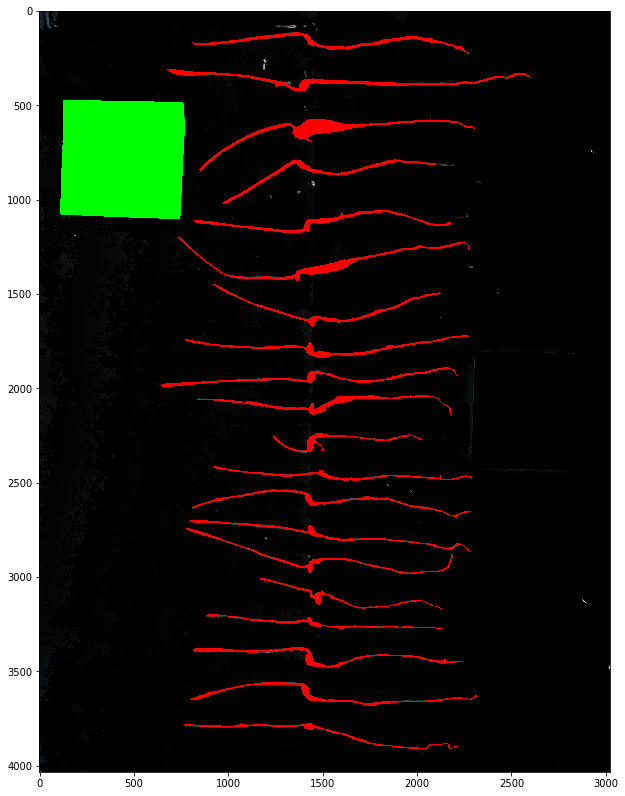

...LOOKING FOR CONTOURS...
paper
20


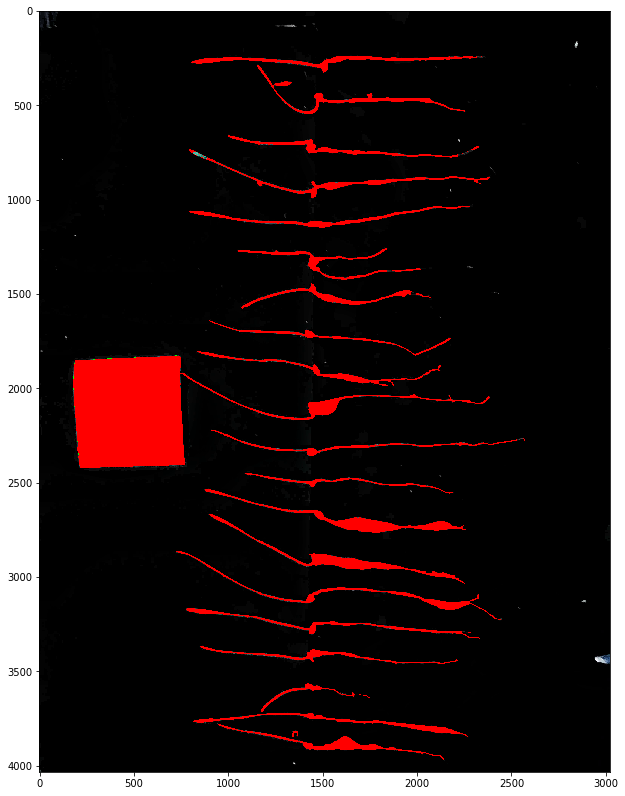

...LOOKING FOR CONTOURS...
paper
21


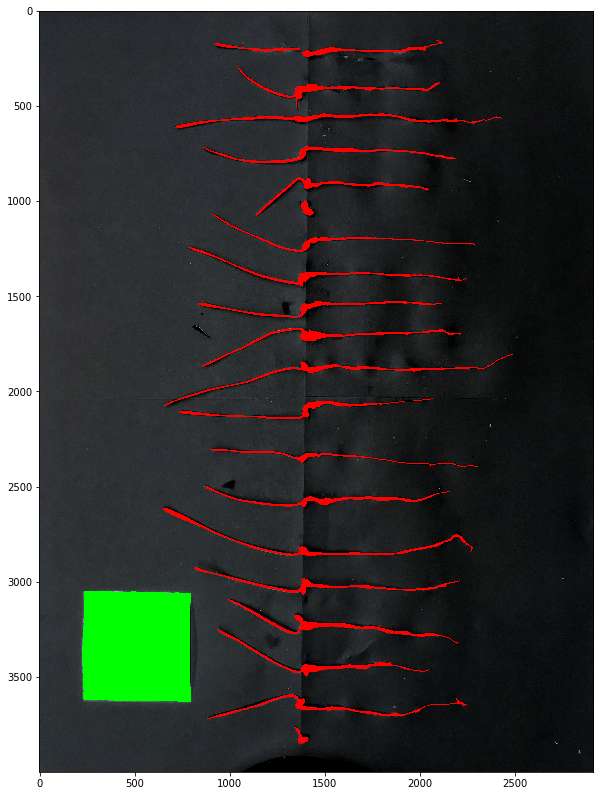

...LOOKING FOR CONTOURS...
paper
22


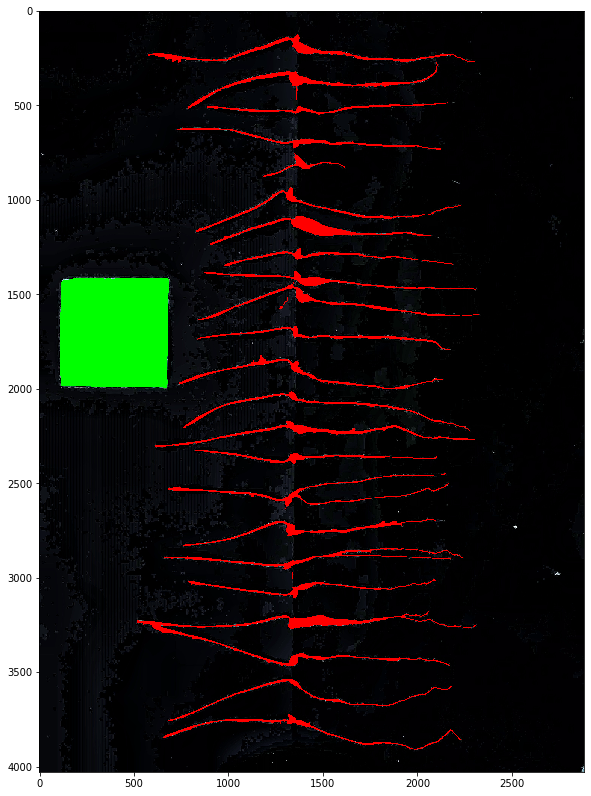

...LOOKING FOR CONTOURS...
paper
20


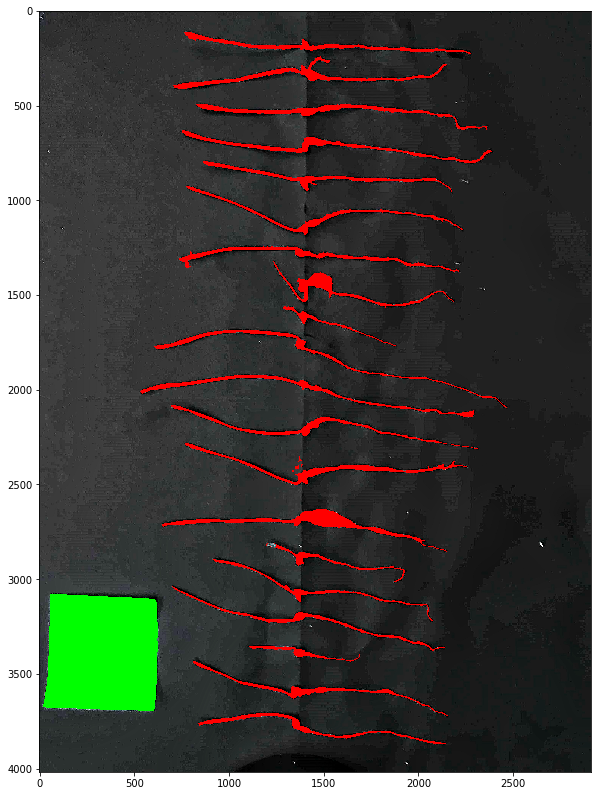

...LOOKING FOR CONTOURS...
22


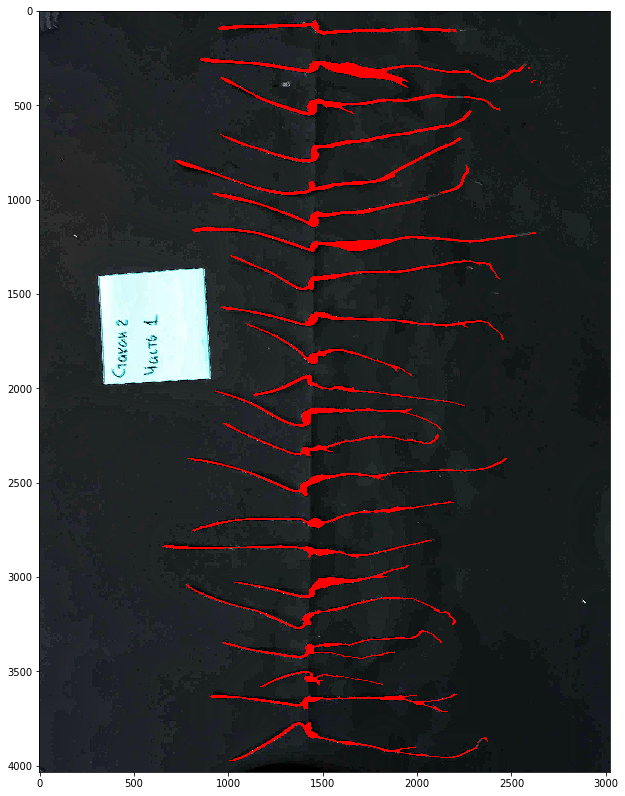

In [23]:
path_to_file_folder = '7day/'

folders_list = folders_list_function(path_to_file_folder)

for g in folders_list:
    path_to_file_folder = '7day/'
    path_to_file_folder = path.join(path_to_file_folder, str(g)+'/')
    for filename_in_folder in listdir(path_to_file_folder):
        
        if filename_in_folder=='.ipynb_checkpoints':
            continue

        ### CONTOURS ###

        print('...LOOKING FOR CONTOURS...')

        file_name =  '120422/1/20220715_102420.jpg'
        file_name = path.join(path_to_file_folder, filename_in_folder)
                ### Plant contour ####       

        src = cv.imread(file_name)
        gr = cv.cvtColor(src, cv.COLOR_BGR2GRAY)
    #         bl = cv.medianBlur(src, 3)
        bl=cv.GaussianBlur(src,(7, 7),0)
        
    #         ret, thresh = cv.threshold(bl, 120,255,0)
        kernel = cv.getStructuringElement(cv.MORPH_RECT, (11, 11))
        closed = cv.morphologyEx(bl, cv.MORPH_CLOSE, kernel)
        canny = cv.Canny(closed, 0, 135)
        kernel = cv.getStructuringElement(cv.MORPH_RECT, (11, 11))
        closed = cv.morphologyEx(canny, cv.MORPH_CLOSE, kernel)
        contours0 = cv.findContours(closed.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)[0]
        # contours0 = contours0[0] if imutils.is_cv2() else contours0[1]
        (contours0, _) = contours.sort_contours(contours0)
        pixelsPerMetric = None
        quantity_of_plants = 0
        real_conts = []
        
        ### Paper contour ###
        ret, binary = cv.threshold(gr, 95, 255, cv.THRESH_BINARY_INV)
        element = cv.getStructuringElement (cv.MORPH_RECT, (11, 11)) # 3 * 3 квадрат, 8-битный тип uchar, все 1 структурные элементы
        binary = cv.morphologyEx(binary, cv.MORPH_CLOSE, element)

        canny_paper = cv.Canny(binary, 10, 100)
        ret, thresh = cv.threshold(gr, 120, 255,0)
        kernel_paper = cv.getStructuringElement(cv.MORPH_RECT, (11, 11))
        closed_paper = cv.morphologyEx(canny_paper, cv.MORPH_CLOSE, kernel_paper)
        contours_paper = cv.findContours(closed_paper.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)[0]
        (contours_paper, _) = contours.sort_contours(contours_paper)
        is_paper_founded = False
        for cont in contours_paper:
#             print('paper')
#             cv.drawContours(src, [cont], -1, (0,255,0), -2)
#             if is_paper_founded:
#                 continue
            center, radius = cv.minEnclosingCircle(cont)
            if (cv.contourArea(cont)>7000)&(center[0] >100):
                is_paper_founded = True
                paper = cont
                print('paper')
                cv.drawContours(src, [cont], -1, (0,255,0), -2)
                break

        
        for cont in contours0:
            center, radius = cv.minEnclosingCircle(cont)
            if (cv.contourArea(cont)>1000)&(center[0] >1000)&(center[0] < 2000):
        #         print(cv.contourArea(cont))
                quantity_of_plants+=1
                #сглаживание и определение количества углов
                sm = cv.arcLength(cont, True)
                apd = cv.approxPolyDP(cont, 0.02*sm, True)
                cv.drawContours(src, [cont], -1, (255,0,0), -2)
                real_conts.append(cont)

                #выделение контуров
        print(quantity_of_plants)
        plt.figure(figsize = (14,14))
        plt.imshow(src)
        plt.show()
    break

7.45


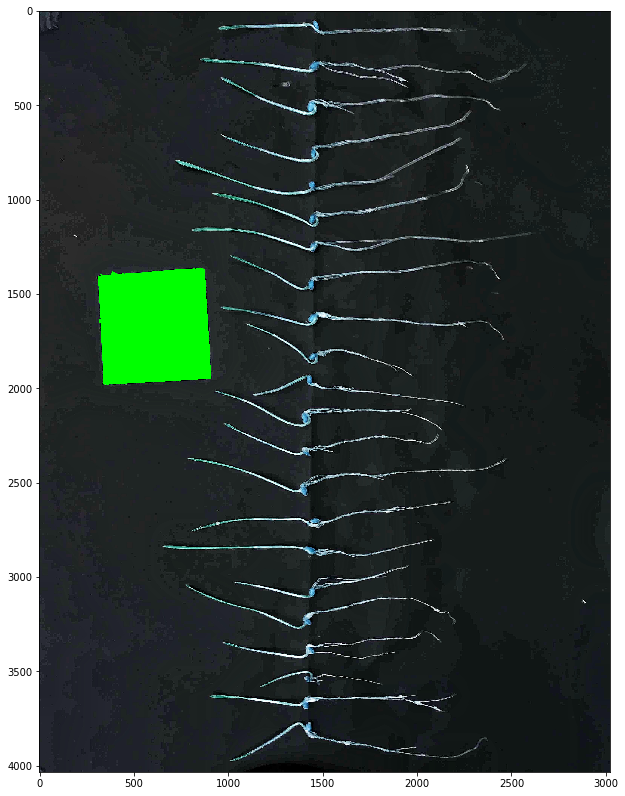

7.45

In [38]:
file_name =  '7day/7day/IMG_20220804_193701_228-01.jpeg'
src = cv.imread(file_name)
find_paper(src,paper_square,paper_square_thresold, position_x_axes(src,x_pos_divider),
                                     canny_top=c_top, canny_bottom=c_bottom,morf=morph)

In [95]:
np.nan+3

nan